Balasuriya Balasuriya

10899180

10899180@students.plymouth.ac.uk

###Importing required Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
import spacy
import praw

In [ ]:
#Downloading stopword data set from nltk
nltk.download('stopwords')

#Downloading punkt tokenizer from nltk
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

### Task 1: Introduction to NLP and Data Collection

Reddit post gathering using praw

In [ ]:
#Installing Python Reddit API Wrapper
!pip install praw

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.3/189.3 kB 5.8 MB/s eta 0:00:00


In [ ]:
#setting up API connection
user_agent = "Scraper 1.0 by /u/Small-Baseball-7194"
reddit = praw.Reddit(
    client_id="pt9Xq0EP5YuFPk2ZU90mTg",
    client_secret="e9XTlV_g_LUi8Mqum_Wm9h7Na6jOaA",
    user_agent=user_agent
)

print("Reddit instance created successfully!")

Reddit instance created successfully!


In [ ]:
headlines = []

#Retrieving reddit post titles
for submission in reddit.subreddit("technology").hot(limit=None):
    title = submission.title if submission.title else "No title"
    post_id = submission.id if submission.id else "No ID"

    headlines.append({"ID": post_id, "Headline": title})

df = pd.DataFrame(headlines)

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/l

Following data is gathered from subreddit  r/technology  which provide global news related to technology I have only extracted the title and the reddit id to do a sentimental analysis

In [ ]:
#Data frame shape
df.shape

(756, 2)

In [ ]:
df.head()

,ID,Headline
0,1hhp5zz,Florida to lose PornHub access
1,1hhucxk,Microsoft really wants users to ditch password...
2,1hhqfx4,Amazon’s RTO delays exemplify why workers get ...
3,1hhpvoa,Chinese cybersecurity centre accuses US of hac...
4,1hhmqp3,Grubhub to pay $25 million for misleading cust...


# Task 2: Text Preprocessing and Tokenization

In [ ]:
#data stats
df.describe

<bound method NDFrame.describe of           ID                                           Headline
0    1hhp5zz                     Florida to lose PornHub access
1    1hhucxk  Microsoft really wants users to ditch password...
2    1hhqfx4  Amazon’s RTO delays exemplify why workers get ...
3    1hhpvoa  Chinese cybersecurity centre accuses US of hac...
4    1hhmqp3  Grubhub to pay $25 million for misleading cust...
..       ...                                                ...
751  1h6six9  OpenAI is partnering with defense tech company...
752  1h6dbvj  Ubisoft shooter XDefiant is shutting down and ...
753  1h6h5wy  US solar module manufacturing capacity reaches...
754  1h62o3o  Two internet cables connecting Sweden and Finl...
755  1h5r10c  Lost Silk Road cities were just discovered wit...

[756 rows x 2 columns]>

In [ ]:
#dataframe information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID        756 non-null    object
 1   Headline  756 non-null    object
dtypes: object(2)
memory usage: 11.9+ KB


In [ ]:
#checking NA valus
df.isnull().sum()

,0
ID,0
Headline,0


In [ ]:
#Removing dublicate values
df = df.drop_duplicates(subset='Headline')

In [ ]:
#dataframe shape after removing dublicates
df.shape

(751, 2)

In [ ]:
#Making a copyof the dataframe(If there were some errors occured)
df1 = df.copy()

In [ ]:
from nltk.corpus import stopwords

# Initialize stopwords
stop_words = set(stopwords.words('english'))

#Function to remove stopwords
def remove_stopwords(text):
    words = text.split()
    words = [word for word in words if word.lower() not in stop_words]
    return ' '.join(words)

#removing stopwords from reddit post titles
df.loc[:, 'Headline'] = df['Headline'].astype(str).apply(lambda x: remove_stopwords(x))

df.head()

,ID,Headline
0,1hhp5zz,Florida lose PornHub access
1,1hhucxk,Microsoft really wants users ditch passwords s...
2,1hhqfx4,Amazon’s RTO delays exemplify workers get mad ...
3,1hhpvoa,Chinese cybersecurity centre accuses US hackin...
4,1hhmqp3,"Grubhub pay $25 million misleading customers, ..."


In [ ]:
# Function to remove special characters and emojis
def remove_special_chars_and_emojis(text):

    text = re.sub(r'[^\w\s,]', '', text)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    return text
#Removing special charactors and emoji's from the headline column
df.loc[:, 'Headline'] = df['Headline'].astype(str).apply(lambda x: remove_special_chars_and_emojis(x))
df.head()

,ID,Headline
0,1hhp5zz,Florida lose PornHub access
1,1hhucxk,Microsoft really wants users ditch passwords s...
2,1hhqfx4,Amazons RTO delays exemplify workers get mad m...
3,1hhpvoa,Chinese cybersecurity centre accuses US hackin...
4,1hhmqp3,"Grubhub pay 25 million misleading customers, r..."


In [ ]:
# Function to clean text

def clean_text(text):
    contractions = {
        r"what's": "what is",
        r"\'s": " ",
        r"\'ve": " have",
        r"can't": "can not",
        r"n't": " not",
        r"i'm": "i am",
        r"\'re": " are",
        r"\'d": " would",
        r"\'ll": " will",
        r"\'scuse": " excuse"
    }

    # Convert to lowercase
    text = text.lower()

    # Replace contractions
    for contraction, replacement in contractions.items():
        text = re.sub(contraction, replacement, text)

    text = re.sub(r'\W', ' ', text)
    text = re.sub(r'\s+', ' ', text)
    text = text.strip()

    return text

# Apply the cleaning function to the columns
df.loc[:, 'Headline'] = df['Headline'].astype(str).apply(lambda x: clean_text(x))

df.head()

,ID,Headline
0,1hhp5zz,florida lose pornhub access
1,1hhucxk,microsoft really wants users ditch passwords s...
2,1hhqfx4,amazons rto delays exemplify workers get mad m...
3,1hhpvoa,chinese cybersecurity centre accuses us hackin...
4,1hhmqp3,grubhub pay 25 million misleading customers re...


Tokanization

In [ ]:
# loading spacy language model
nlp = spacy.load("en_core_web_sm")

# Tokenizing function using SpaCy
def tokenize_with_spacy(text):
    if isinstance(text, list):
        text = " ".join(text)
    doc = nlp(text)
    tokens = [token.text for token in doc]
    return tokens

# tokenization to the Headline column
df.loc[:, 'HeadlineTokens'] = df['Headline'].apply(tokenize_with_spacy)

df.head()

<ipython-input-21-7b598d33c9fa>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'HeadlineTokens'] = df['Headline'].apply(tokenize_with_spacy)


,ID,Headline,HeadlineTokens
0,1hhp5zz,florida lose pornhub access,"[florida, lose, pornhub, access]"
1,1hhucxk,microsoft really wants users ditch passwords s...,"[microsoft, really, wants, users, ditch, passw..."
2,1hhqfx4,amazons rto delays exemplify workers get mad m...,"[amazons, rto, delays, exemplify, workers, get..."
3,1hhpvoa,chinese cybersecurity centre accuses us hackin...,"[chinese, cybersecurity, centre, accuses, us, ..."
4,1hhmqp3,grubhub pay 25 million misleading customers re...,"[grubhub, pay, 25, million, misleading, custom..."


Lemmatization

In [ ]:
# Lemmatization function
def lemmatize_with_spacy(tokens):
    if isinstance(tokens, list):
        tokens = " ".join(tokens)
    doc = nlp(tokens)
    lemmatized_tokens = [token.lemma_ for token in doc]
    return lemmatized_tokens
#Lemmatizing Headline tokens and adding it to another seperate column called 'LemmatizedHeadlineTokens'
df.loc[:, 'LemmatizedHeadlineTokens'] = df['HeadlineTokens'].apply(lemmatize_with_spacy)

df.head()

,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens
0,1hhp5zz,florida lose pornhub access,"[florida, lose, pornhub, access]","[florida, lose, pornhub, access]"
1,1hhucxk,microsoft really wants users ditch passwords s...,"[microsoft, really, wants, users, ditch, passw...","[microsoft, really, want, user, ditch, passwor..."
2,1hhqfx4,amazons rto delays exemplify workers get mad m...,"[amazons, rto, delays, exemplify, workers, get...","[amazon, rto, delay, exemplify, worker, get, m..."
3,1hhpvoa,chinese cybersecurity centre accuses us hackin...,"[chinese, cybersecurity, centre, accuses, us, ...","[chinese, cybersecurity, centre, accuse, we, h..."
4,1hhmqp3,grubhub pay 25 million misleading customers re...,"[grubhub, pay, 25, million, misleading, custom...","[grubhub, pay, 25, million, misleading, custom..."


Combining words to a sentence

In [ ]:
#Word combining function
def lemmatize_with_spacy(tokens):
    if isinstance(tokens, list):
        tokens = " ".join(tokens)
    doc = nlp(tokens)
    lemmatized_tokens = [token.lemma_ for token in doc]
    return " ".join(lemmatized_tokens)

# Appling the function to the 'HeadlineTokens' column
df.loc[:, 'LemmatizedHeadline'] = df['LemmatizedHeadlineTokens'].apply(lemmatize_with_spacy)

df.head()

<ipython-input-25-ae6ebc22f192>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'LemmatizedHeadline'] = df['LemmatizedHeadlineTokens'].apply(lemmatize_with_spacy)


,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens,LemmatizedHeadline
0,1hhp5zz,florida lose pornhub access,"[florida, lose, pornhub, access]","[florida, lose, pornhub, access]",florida lose pornhub access
1,1hhucxk,microsoft really wants users ditch passwords s...,"[microsoft, really, wants, users, ditch, passw...","[microsoft, really, want, user, ditch, passwor...",microsoft really want user ditch password swit...
2,1hhqfx4,amazons rto delays exemplify workers get mad m...,"[amazons, rto, delays, exemplify, workers, get...","[amazon, rto, delay, exemplify, worker, get, m...",amazon rto delay exemplify worker get mad mand...
3,1hhpvoa,chinese cybersecurity centre accuses us hackin...,"[chinese, cybersecurity, centre, accuses, us, ...","[chinese, cybersecurity, centre, accuse, we, h...",chinese cybersecurity centre accuse we hack st...
4,1hhmqp3,grubhub pay 25 million misleading customers re...,"[grubhub, pay, 25, million, misleading, custom...","[grubhub, pay, 25, million, misleading, custom...",grubhub pay 25 million mislead customer restau...


Performing bigram and trigram

In [ ]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
from nltk.tokenize import word_tokenize

#Function to make n-grams
def get_n_grams(text, n):
    if isinstance(text, str):
        tokens = nltk.word_tokenize(text)
        n_grams = zip(*[tokens[i:] for i in range(n)])
        return [" ".join(ngram) for ngram in n_grams]
    else:
        return []

# n-gram function for columns
def generate_ngrams(df, column_name, n):
    return df[column_name].apply(lambda x: get_n_grams(x, n))

# Generating bigrams and trigrams for the 'LemmatizedHeadline' column
df.loc[:, 'bigrams_LemmatizedHeadline'] = generate_ngrams(df, 'LemmatizedHeadline', 2)
df.loc[:, 'trigrams_LemmatizedHeadline'] = generate_ngrams(df, 'LemmatizedHeadline', 3)

df.head()

<ipython-input-27-cb58cc489736>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'bigrams_LemmatizedHeadline'] = generate_ngrams(df, 'LemmatizedHeadline', 2)
<ipython-input-27-cb58cc489736>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, 'trigrams_LemmatizedHeadline'] = generate_ngrams(df, 'LemmatizedHeadline', 3)


,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens,LemmatizedHeadline,bigrams_LemmatizedHeadline,trigrams_LemmatizedHeadline
0,1hhp5zz,florida lose pornhub access,"[florida, lose, pornhub, access]","[florida, lose, pornhub, access]",florida lose pornhub access,"[florida lose, lose pornhub, pornhub access]","[florida lose pornhub, lose pornhub access]"
1,1hhucxk,microsoft really wants users ditch passwords s...,"[microsoft, really, wants, users, ditch, passw...","[microsoft, really, want, user, ditch, passwor...",microsoft really want user ditch password swit...,"[microsoft really, really want, want user, use...","[microsoft really want, really want user, want..."
2,1hhqfx4,amazons rto delays exemplify workers get mad m...,"[amazons, rto, delays, exemplify, workers, get...","[amazon, rto, delay, exemplify, worker, get, m...",amazon rto delay exemplify worker get mad mand...,"[amazon rto, rto delay, delay exemplify, exemp...","[amazon rto delay, rto delay exemplify, delay ..."
3,1hhpvoa,chinese cybersecurity centre accuses us hackin...,"[chinese, cybersecurity, centre, accuses, us, ...","[chinese, cybersecurity, centre, accuse, we, h...",chinese cybersecurity centre accuse we hack st...,"[chinese cybersecurity, cybersecurity centre, ...","[chinese cybersecurity centre, cybersecurity c..."
4,1hhmqp3,grubhub pay 25 million misleading customers re...,"[grubhub, pay, 25, million, misleading, custom...","[grubhub, pay, 25, million, misleading, custom...",grubhub pay 25 million mislead customer restau...,"[grubhub pay, pay 25, 25 million, million misl...","[grubhub pay 25, pay 25 million, 25 million mi..."


#Task 3: POS Tagging and Named Entity Recognition (NER)

In [ ]:
token_data = []

#POS analysis for each token
for text in df['LemmatizedHeadline']:
    doc = nlp(text)
    for token in doc:
        token_data.append({
            "Token": token.text,
            "POS": token.pos_,
            "POS_Explanation": spacy.explain(token.pos_)
        })

#assigning POS to a new dataframe
token_df = pd.DataFrame(token_data)

token_df.head()

,Token,POS,POS_Explanation
0,florida,PROPN,proper noun
1,lose,VERB,verb
2,pornhub,PROPN,proper noun
3,access,NOUN,noun
4,microsoft,PROPN,proper noun


In [ ]:
#length of token_df
len(token_df)

7763

Most common parts of speech

In [ ]:
from collections import Counter

# Counting each POS tag occurance
pos_counts = Counter(token_df['POS'])

# converting counts to a dataframe
pos_df = pd.DataFrame(pos_counts.items(), columns=['POS', 'Count']).sort_values(by='Count', ascending=False)

# display pos tags and counts
print(pos_df)

      POS  Count
2    NOUN   3288
0   PROPN   1664
1    VERB   1082
4     ADJ    867
6     NUM    310
3     ADV    181
5    PRON    116
9     AUX    111
8     ADP     65
12   PART     25
7     DET     20
11  SCONJ     11
10  CCONJ      6
13      X      5
15    SYM      5
16  PUNCT      5
14   INTJ      2


Named Entity Recognition

In [ ]:
#making an empty list
ner_data = []

# Loop through each row in the LemmatizedHeadline column
for text in df['LemmatizedHeadline']:
    doc = nlp(text)  # Processing the text with spacy
    for ent in doc.ents:
        # adding components to the empty list
        ner_data.append({
            "Text": text,
            "Entity": ent.text,
            "Label": ent.label_,
            "Explanation": spacy.explain(ent.label_)
        })

# Converting the dictionary to a dataframe
ner_df = pd.DataFrame(ner_data)

# display dataFrame
ner_df.head()

,Text,Entity,Label,Explanation
0,florida lose pornhub access,florida,GPE,"Countries, cities, states"
1,microsoft really want user ditch password swit...,microsoft,ORG,"Companies, agencies, institutions, etc."
2,amazon rto delay exemplify worker get mad mand...,rto,PERSON,"People, including fictional"
3,chinese cybersecurity centre accuse we hack st...,chinese,NORP,Nationalities or religious or political groups
4,grubhub pay 25 million mislead customer restau...,25 million,CARDINAL,Numerals that do not fall under another type


# Task 4: Sentiment Analysis

In [ ]:
from textblob import TextBlob

# Function to analyze sentiment
def analyze_sentiment(text):
    polarity = TextBlob(text).sentiment.polarity
    if polarity > 0:
        return "Positive"
    elif polarity < 0:
        return "Negative"
    else:
        return "Neutral"

# Applying sentiment analysis function and making a seperate column for sentiments
df['SentimentofLemmatizedHeadline'] = df['LemmatizedHeadline'].apply(analyze_sentiment)

<ipython-input-33-dd9382bcfc73>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SentimentofLemmatizedHeadline'] = df['LemmatizedHeadline'].apply(analyze_sentiment)


In [ ]:
df.head()

,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens,LemmatizedHeadline,bigrams_LemmatizedHeadline,trigrams_LemmatizedHeadline,SentimentofLemmatizedHeadline
0,1hhp5zz,florida lose pornhub access,"[florida, lose, pornhub, access]","[florida, lose, pornhub, access]",florida lose pornhub access,"[florida lose, lose pornhub, pornhub access]","[florida lose pornhub, lose pornhub access]",Neutral
1,1hhucxk,microsoft really wants users ditch passwords s...,"[microsoft, really, wants, users, ditch, passw...","[microsoft, really, want, user, ditch, passwor...",microsoft really want user ditch password swit...,"[microsoft really, really want, want user, use...","[microsoft really want, really want user, want...",Positive
2,1hhqfx4,amazons rto delays exemplify workers get mad m...,"[amazons, rto, delays, exemplify, workers, get...","[amazon, rto, delay, exemplify, worker, get, m...",amazon rto delay exemplify worker get mad mand...,"[amazon rto, rto delay, delay exemplify, exemp...","[amazon rto delay, rto delay exemplify, delay ...",Negative
3,1hhpvoa,chinese cybersecurity centre accuses us hackin...,"[chinese, cybersecurity, centre, accuses, us, ...","[chinese, cybersecurity, centre, accuse, we, h...",chinese cybersecurity centre accuse we hack st...,"[chinese cybersecurity, cybersecurity centre, ...","[chinese cybersecurity centre, cybersecurity c...",Negative
4,1hhmqp3,grubhub pay 25 million misleading customers re...,"[grubhub, pay, 25, million, misleading, custom...","[grubhub, pay, 25, million, misleading, custom...",grubhub pay 25 million mislead customer restau...,"[grubhub pay, pay 25, 25 million, million misl...","[grubhub pay 25, pay 25 million, 25 million mi...",Neutral


In [ ]:
# displaying sentiment counts
sentiment_counts = df['SentimentofLemmatizedHeadline'].value_counts()
print("Sentiment Distribution:")
print(sentiment_counts)

Sentiment Distribution:
SentimentofLemmatizedHeadline
Neutral     383
Positive    226
Negative    142
Name: count, dtype: int64


Sentiment Visualization

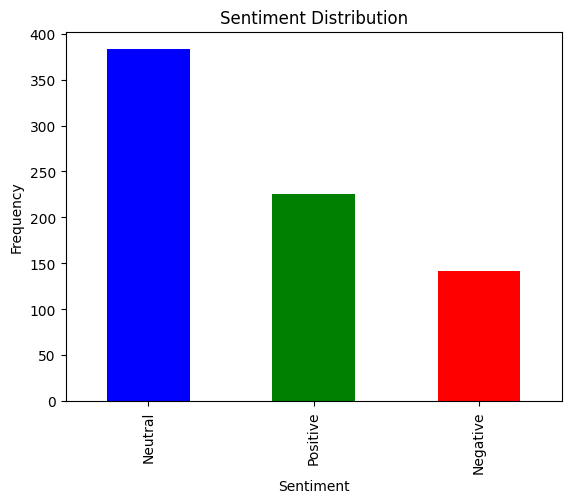

In [ ]:
# Ploting sentiment distribution
sentiment_counts.plot(kind='bar', color=['blue', 'green', 'red'])
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Frequency')
plt.show()

# Task 5: Topic Modeling

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# vectorizing the text data
tfidf_vectorizer = TfidfVectorizer(max_df=0.85, min_df=2, stop_words='english', ngram_range=(1, 2))
tfidf_matrix = tfidf_vectorizer.fit_transform(df['LemmatizedHeadline'])

# applying LDA for topic modeling
lda_model = LatentDirichletAllocation(n_components=3, random_state=42, learning_method='online')
lda_model.fit(tfidf_matrix)

# extracting topics and keywords
def extract_topics(model, feature_names, num_keywords):
    topic_keywords = {}
    for topic_idx, topic in enumerate(model.components_):
        top_keywords = [feature_names[i] for i in topic.argsort()[:-num_keywords - 1:-1]]
        topic_keywords[f"Topic {topic_idx+1}"] = top_keywords
    return topic_keywords

# displaying top 7 keywords for each topic
num_keywords = 7
feature_names = tfidf_vectorizer.get_feature_names_out()
topics_dict = extract_topics(lda_model, feature_names, num_keywords)

print("Identified Topics and Keywords:")
for topic, keywords in topics_dict.items():
    print(f"{topic}: {', '.join(keywords)}")

#assigning topics to each headline
topic_probabilities = lda_model.transform(tfidf_matrix)
df['Assigned_Topic'] = topic_probabilities.argmax(axis=1) + 1

#mapping topic numbers to corresponding keywords
topic_mapping = {idx + 1: ', '.join(keywords) for idx, keywords in enumerate(topics_dict.values())}
df['Topic_Keywords'] = df['Assigned_Topic'].map(topic_mapping)

# displaying DataFrame with assigned topics and keywords
print(df[['LemmatizedHeadline', 'Assigned_Topic', 'Topic_Keywords']].head())

Identified Topics and Keywords:
Topic 1: ai, new, use, microsoft, apple, datum, china
Topic 2: say, ai, google, chip, world, facebook, new
Topic 3: tiktok, ban, amazon, ai, court, stop, say
                                  LemmatizedHeadline  Assigned_Topic  \
0                        florida lose pornhub access               1   
1  microsoft really want user ditch password swit...               3   
2  amazon rto delay exemplify worker get mad mand...               1   
3  chinese cybersecurity centre accuse we hack st...               3   
4  grubhub pay 25 million mislead customer restau...               3   

                                 Topic_Keywords  
0  ai, new, use, microsoft, apple, datum, china  
1     tiktok, ban, amazon, ai, court, stop, say  
2  ai, new, use, microsoft, apple, datum, china  
3     tiktok, ban, amazon, ai, court, stop, say  
4     tiktok, ban, amazon, ai, court, stop, say  


<ipython-input-37-01be1c8b5feb>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Assigned_Topic'] = topic_probabilities.argmax(axis=1) + 1
<ipython-input-37-01be1c8b5feb>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Topic_Keywords'] = df['Assigned_Topic'].map(topic_mapping)


In [ ]:
df.head()

,ID,Headline,HeadlineTokens,LemmatizedHeadlineTokens,LemmatizedHeadline,bigrams_LemmatizedHeadline,trigrams_LemmatizedHeadline,SentimentofLemmatizedHeadline,Assigned_Topic,Topic_Keywords
0,1hhp5zz,florida lose pornhub access,"[florida, lose, pornhub, access]","[florida, lose, pornhub, access]",florida lose pornhub access,"[florida lose, lose pornhub, pornhub access]","[florida lose pornhub, lose pornhub access]",Neutral,1,"ai, new, use, microsoft, apple, datum, china"
1,1hhucxk,microsoft really wants users ditch passwords s...,"[microsoft, really, wants, users, ditch, passw...","[microsoft, really, want, user, ditch, passwor...",microsoft really want user ditch password swit...,"[microsoft really, really want, want user, use...","[microsoft really want, really want user, want...",Positive,3,"tiktok, ban, amazon, ai, court, stop, say"
2,1hhqfx4,amazons rto delays exemplify workers get mad m...,"[amazons, rto, delays, exemplify, workers, get...","[amazon, rto, delay, exemplify, worker, get, m...",amazon rto delay exemplify worker get mad mand...,"[amazon rto, rto delay, delay exemplify, exemp...","[amazon rto delay, rto delay exemplify, delay ...",Negative,1,"ai, new, use, microsoft, apple, datum, china"
3,1hhpvoa,chinese cybersecurity centre accuses us hackin...,"[chinese, cybersecurity, centre, accuses, us, ...","[chinese, cybersecurity, centre, accuse, we, h...",chinese cybersecurity centre accuse we hack st...,"[chinese cybersecurity, cybersecurity centre, ...","[chinese cybersecurity centre, cybersecurity c...",Negative,3,"tiktok, ban, amazon, ai, court, stop, say"
4,1hhmqp3,grubhub pay 25 million misleading customers re...,"[grubhub, pay, 25, million, misleading, custom...","[grubhub, pay, 25, million, misleading, custom...",grubhub pay 25 million mislead customer restau...,"[grubhub pay, pay 25, 25 million, million misl...","[grubhub pay 25, pay 25 million, 25 million mi...",Neutral,3,"tiktok, ban, amazon, ai, court, stop, say"


In [ ]:
# counting unique topics and their count
topic_counts = df['Assigned_Topic'].value_counts()

# displaying the unique topics and their counts
print("Unique Topics and Their Counts:")
print(topic_counts)

Unique Topics and Their Counts:
Assigned_Topic
1    327
2    217
3    207
Name: count, dtype: int64


In [ ]:
# mapping labels to keywords
print("Topic Label to Keywords Mapping:")
for topic_label, keywords in topic_mapping.items():
    print(f"Label {topic_label}: {keywords}")

Topic Label to Keywords Mapping:
Label 1: ai, new, use, microsoft, apple, datum, china
Label 2: say, ai, google, chip, world, facebook, new
Label 3: tiktok, ban, amazon, ai, court, stop, say


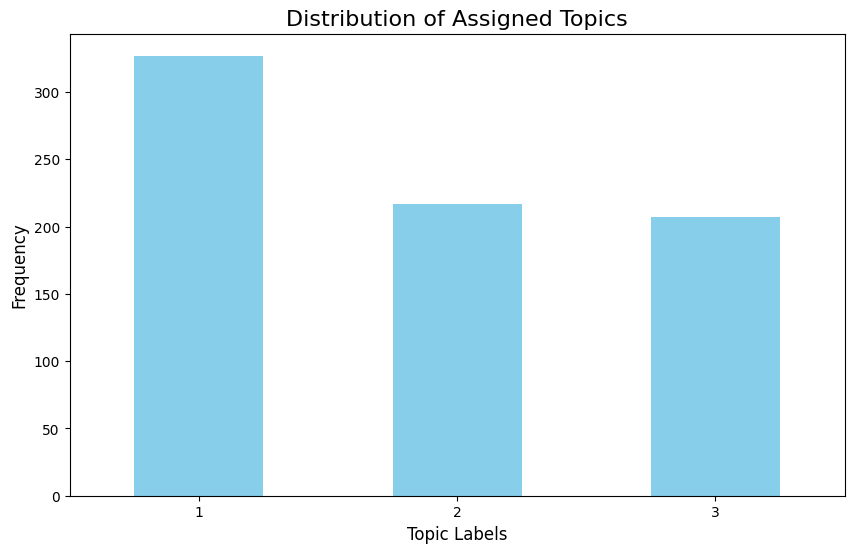

In [ ]:
# plotting the bar graph
plt.figure(figsize=(10, 6))
topic_counts.plot(kind='bar', color='skyblue')

# adding titles and labels
plt.title('Distribution of Assigned Topics', fontsize=16)
plt.xlabel('Topic Labels', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# displaying the graph
plt.xticks(rotation=0)
plt.show()

# Task 6: Stylometric Analysis and Visualization

PCA analysis for LemmatizedHeadline column

Most common 50 words

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

#stylometric Features extraction
vectorizer1 = CountVectorizer(analyzer='word', stop_words='english', max_features=50)
X = vectorizer1.fit_transform(df['LemmatizedHeadline']).toarray()

#display extracted features
feature_names = vectorizer1.get_feature_names_out()
print("Extracted Features (Top 50 words from LemmatizedHeadline):")
print(feature_names)

# Checking the shape of the resulting matrix
print(f"\nFeature matrix shape: {X.shape}")

Extracted Features (Top 50 words from LemmatizedHeadline):
['ai' 'amazon' 'app' 'apple' 'ban' 'big' 'billion' 'ceo' 'china' 'chip'
 'claim' 'company' 'court' 'datum' 'device' 'drone' 'game' 'google' 'gpu'
 'help' 'intel' 'launch' 'law' 'like' 'make' 'meta' 'microsoft' 'million'
 'model' 'new' 'nvidia' 'openai' 'pay' 'plan' 'power' 'report' 'rule'
 'say' 'security' 'social' 'stop' 'tech' 'test' 'tiktok' 'trump' 'use'
 'user' 'window' 'world' 'year']

Feature matrix shape: (751, 50)


Most 50 important words

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

#using TF-IDF Vectorizer
vectorizer2 = TfidfVectorizer(stop_words='english', max_features=50)
X_tfidf = vectorizer2.fit_transform(df['LemmatizedHeadline']).toarray()

# Retrieve the feature names
top_words = vectorizer2.get_feature_names_out()

# displaying the most important words
print("Top 50 Important Words (Based on TF-IDF) from LemmatizedHeadline:")
print(top_words)

# display the shape of the resulting matrix
print(f"\nTF-IDF Feature Matrix Shape: {X_tfidf.shape}")

Top 50 Important Words (Based on TF-IDF) from LemmatizedHeadline:
['ai' 'amazon' 'app' 'apple' 'ban' 'big' 'billion' 'ceo' 'china' 'chip'
 'claim' 'company' 'court' 'datum' 'device' 'drone' 'game' 'google' 'gpu'
 'help' 'intel' 'launch' 'law' 'like' 'make' 'meta' 'microsoft' 'million'
 'model' 'new' 'nvidia' 'openai' 'pay' 'plan' 'power' 'report' 'rule'
 'say' 'security' 'social' 'stop' 'tech' 'test' 'tiktok' 'trump' 'use'
 'user' 'window' 'world' 'year']

TF-IDF Feature Matrix Shape: (751, 50)


PCA,K-Means cluster and the scatterplot for Most common 50 words

In [ ]:
from sklearn.decomposition import PCA

#principal component analysis
pca1 = PCA(n_components=2)
X_pca1 = pca1.fit_transform(X)

In [ ]:
#K-means clustering
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=42)
df['HeadlineCluster1'] = kmeans.fit_predict(X)

<ipython-input-49-01c9894e1869>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['HeadlineCluster1'] = kmeans.fit_predict(X)


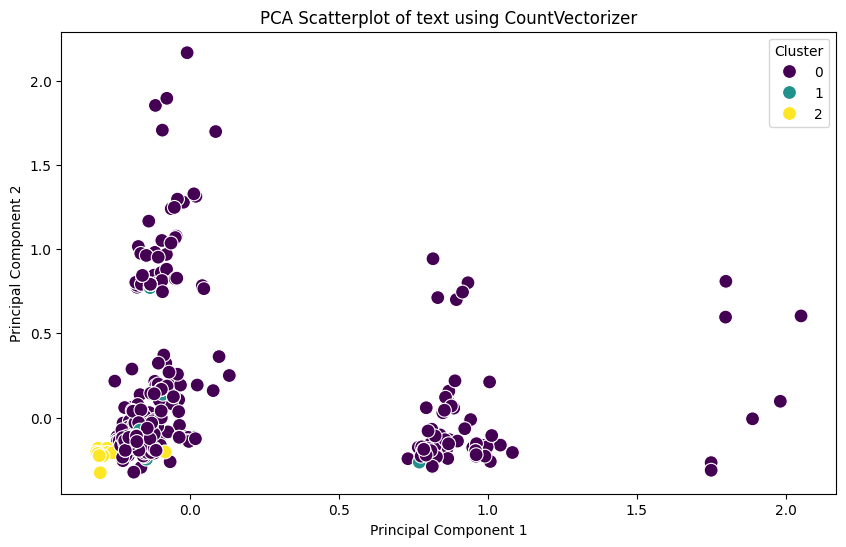

In [ ]:
#PCA1 Scatterplot using countervectorizer
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca1[:, 0], y=X_pca1[:, 1], hue=df['HeadlineCluster1'], palette='viridis', s=100)
plt.title('PCA Scatterplot of text using CountVectorizer')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

PCA,K-Means cluster and the scatterplot for Most important words

In [ ]:
#principal component analysis
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(X_tfidf)

In [ ]:
#K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['HeadlineCluster2'] = kmeans.fit_predict(X_tfidf)

<ipython-input-53-12eb2514e090>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['HeadlineCluster2'] = kmeans.fit_predict(X_tfidf)


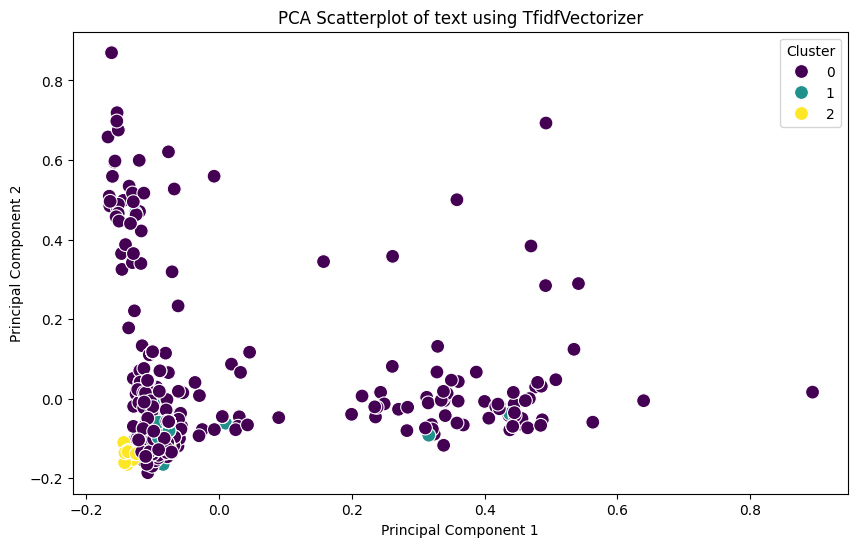

In [ ]:
#PCA2 Scatterplot using tf-idf
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca2[:, 0], y=X_pca2[:, 1], hue=df['HeadlineCluster1'], palette='viridis', s=100)
plt.title('PCA Scatterplot of text using TfidfVectorizer')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

Comparison of the two plots

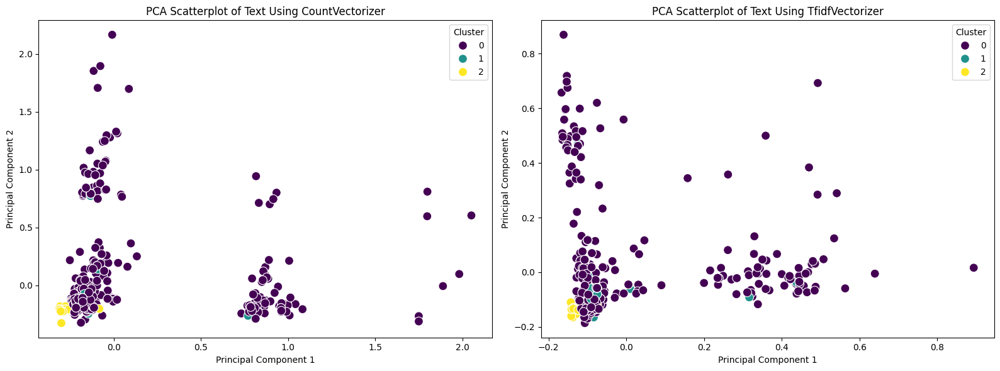

In [ ]:
#creating two plots together for better visualization

#creating the figure
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

#PCA Scatterplot for CountVectorizer
sns.scatterplot(x=X_pca1[:, 0], y=X_pca1[:, 1], hue=df['HeadlineCluster1'], palette='viridis', s=100, ax=axes[0])
axes[0].set_title('PCA Scatterplot of Text Using CountVectorizer')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')
axes[0].legend(title='Cluster')

#PCA Scatterplot for TfidfVectorizer
sns.scatterplot(x=X_pca2[:, 0], y=X_pca2[:, 1], hue=df['HeadlineCluster1'], palette='viridis', s=100, ax=axes[1])
axes[1].set_title('PCA Scatterplot of Text Using TfidfVectorizer')
axes[1].set_xlabel('Principal Component 1')
axes[1].set_ylabel('Principal Component 2')
axes[1].legend(title='Cluster')

#layout adjestment
plt.tight_layout()
plt.show()

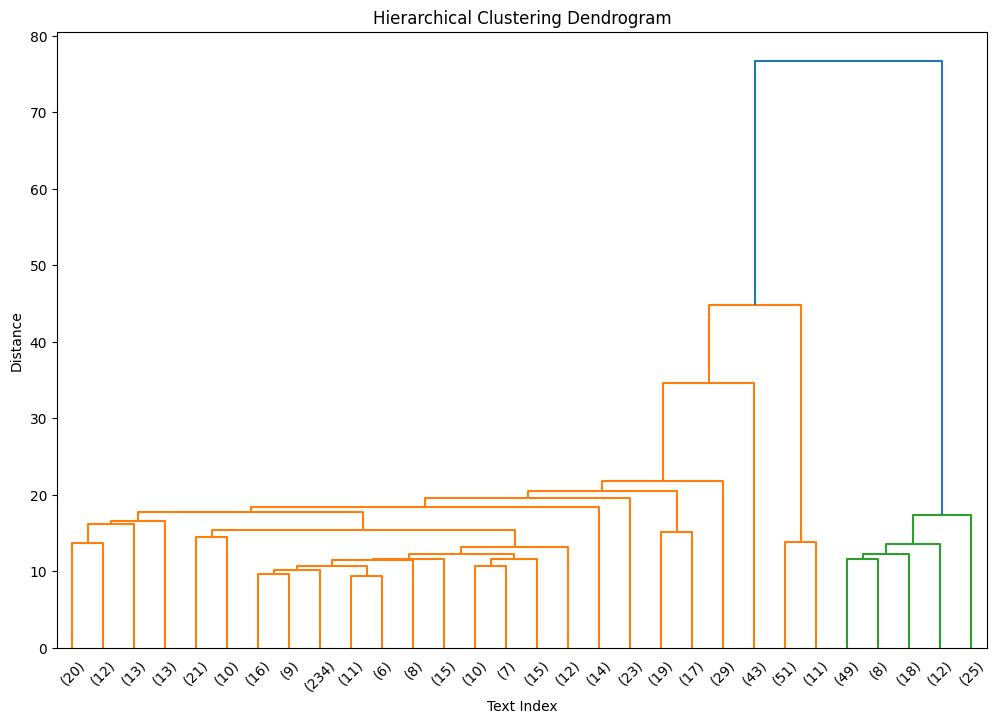

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, linkage

#Extracting features from the 'LemmatizedHeadline' column
vectorizer = CountVectorizer(analyzer='word', stop_words='english', max_features=50)
X = vectorizer.fit_transform(df['LemmatizedHeadline']).toarray()

#Calculating cosine similarity matrix
similarity_matrix = cosine_similarity(X)
distance_matrix = 1 - similarity_matrix

#Performing hierarchical clustering
linked = linkage(distance_matrix, method='ward')

#Ploting the dendrogram
plt.figure(figsize=(12, 8))
dendrogram(linked,
           labels=df['LemmatizedHeadline'].values,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True,
           truncate_mode='lastp',
           p=30
           )

#adding labels to the ploy
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Text Index')
plt.ylabel('Distance')

# Displaying the plot
plt.show()

# Task 7: Document Clustering with Word2Vec or Doc2Vec

Finding similarities amoung sentences

In [ ]:
from sklearn.manifold import TSNE
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize

# Seting the visualization style
sns.set(style="whitegrid")

# Preprocessing the teaxt
def tokenize_text(text):
    return word_tokenize(text.lower())

# Training word2vec tokenizer for LemmatizedHeadline column
word2vec_model = Word2Vec(sentences=df['LemmatizedHeadline'].apply(tokenize_text), vector_size=50, window=5, min_count=1, workers=4)

#Creating document vectors by averaging word embeddings
def create_average_vector(tokens, model):
    # Average word embeddings for valid tokens in the model
    valid_tokens = [token for token in tokens if token in model.wv]
    if not valid_tokens:
        return np.zeros(50)
    return np.mean([model.wv[token] for token in valid_tokens], axis=0)

# Applying the function to create document vectors for each headline
df['doc_vector'] = df['LemmatizedHeadline'].apply(lambda x: create_average_vector(tokenize_text(x), word2vec_model))

# Converting document vectors to a feature matrix
doc_vectors = np.array(list(df['doc_vector']))

# Applying K-Means Clustering to the document vectors
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['cluster'] = kmeans.fit_predict(doc_vectors)

# dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
reduced_features = tsne.fit_transform(doc_vectors)

<ipython-input-58-dc8d6dbebcb5>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['doc_vector'] = df['LemmatizedHeadline'].apply(lambda x: create_average_vector(tokenize_text(x), word2vec_model))
<ipython-input-58-dc8d6dbebcb5>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cluster'] = kmeans.fit_predict(doc_vectors)


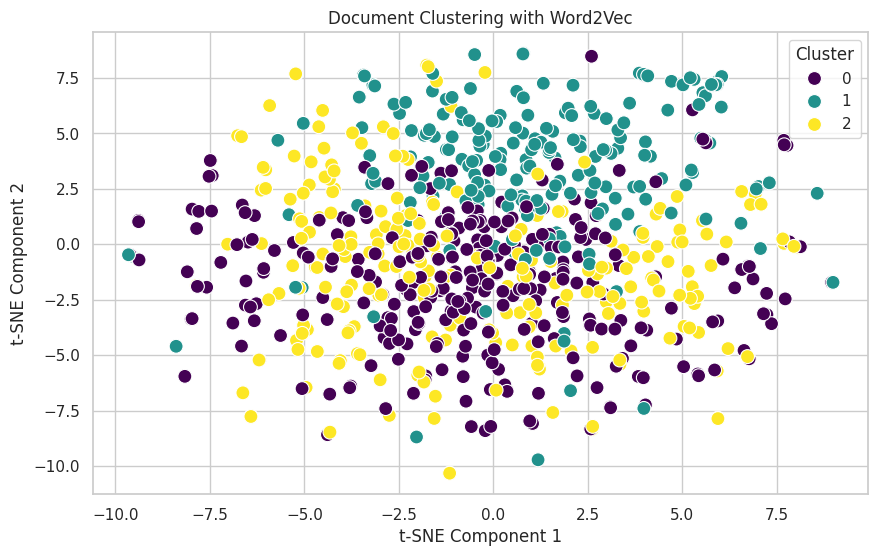

In [ ]:
# plotting the Clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=reduced_features[:, 0], y=reduced_features[:, 1], hue=df['cluster'], palette="viridis", s=100)
plt.title("Document Clustering with Word2Vec")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Cluster")
plt.show()

In [ ]:
# Displaying the clustered documents
print("\nClustered Documents:")
for cluster_id in range(n_clusters):
    print(f"\nCluster {cluster_id}:")
    cluster_texts = df[df['cluster'] == cluster_id]['LemmatizedHeadline'].tolist()  # Use 'LemmatizedHeadline'
    for text in cluster_texts:
        print(f" - {text}")


Clustered Documents:

Cluster 0:
 - florida lose pornhub access
 - amazon rto delay exemplify worker get mad mandate amazon lack space accommodate entire workforce
 - chinese cybersecurity centre accuse we hack steal tech secret
 - grubhub pay 25 million mislead customer restaurant driver
 - realpage pricing software add billion rental cost say white house renter we spend extra 38 billion last year allegedly due landlord price coordination
 - trump block government military buying evs trumps attack clean vehicle big thought say report
 - we government urge highranke official lock mobile device follow telecom breach
 - we chemist debunk 100yearold bredts rule change organic chemistry forever
 - two bestselle console we history officially nintendo switch bump ps2 third place nintendo affordability strike
 - we government set approve spend 3 billion remove chinese telecom equipment
 - dji evade we block one year prove product national security threat clause 895 billion us defense bill st

In [ ]:
# Geting the cluster centers
cluster_centers = kmeans.cluster_centers_
print("Cluster Centers (average of document vectors for each cluster):")
print(cluster_centers)

Cluster Centers (average of document vectors for each cluster):
[[ 1.8515240e-03 -3.8734305e-04  6.9441419e-05 -3.8321764e-04
   3.7098245e-05 -4.8352859e-04  7.6841860e-04  1.3174713e-03
  -1.0599286e-03 -4.5968714e-04 -8.2623411e-04 -1.8831831e-04
  -3.8851751e-05 -3.4031342e-05 -5.5628608e-04 -4.2920213e-04
   6.8592402e-04 -5.8818376e-04 -5.8246020e-04 -1.3121413e-03
   2.0378620e-04  3.8484391e-04  1.6832908e-03  1.2239005e-05
   5.6060439e-04  2.9721187e-04 -1.1474958e-03 -6.6644151e-04
  -1.3623149e-03  7.7078829e-04  2.2263039e-04  3.3534531e-04
   3.9264627e-04 -9.8332879e-04  6.4246939e-05  3.0314841e-04
  -1.0469753e-03 -6.3520507e-04  9.1987173e-04 -9.1219204e-04
   1.7055630e-04 -2.4790352e-06  4.9605209e-04  6.5361254e-04
   1.8508940e-03 -2.5261729e-04  3.9534716e-05 -7.9345092e-04
   3.7563441e-04  8.9027034e-04]
 [ 4.8969133e-04  1.2302375e-04  5.0067768e-04  2.2130851e-03
  -2.2788295e-03 -3.2139071e-03  2.5930940e-03  3.2046107e-03
  -3.1700344e-03 -2.2505620e-03  5.

In [ ]:
# function to the top words for each cluster center
def get_top_words_for_cluster(cluster_center, model, n_top_words=10):
    # Calculating similarity between each word's vector and the cluster center
    word_similarities = {}
    for word in model.wv.index_to_key:
        word_similarities[word] = np.dot(model.wv[word], cluster_center)
    # Sort words by their similarity to the cluster center
    sorted_words = sorted(word_similarities.items(), key=lambda x: x[1], reverse=True)
    top_words = [word for word, _ in sorted_words[:n_top_words]]
    return top_words

# For each cluster center, find the top relevant words
for i, center in enumerate(cluster_centers):
    top_words = get_top_words_for_cluster(center, word2vec_model)
    print(f"Cluster {i} Top Words: {', '.join(top_words)}")

Cluster 0 Top Words: chinese, ticket, trump, boeing, could, ai, speaker, globally, nowdead, result
Cluster 1 Top Words: ai, healthcare, tiktok, trump, unveil, say, app, target, create, infiltrate
Cluster 2 Top Words: say, reddit, intel, new, endorsement, spherical, credit, app, like, rosenworcel


In [ ]:
# Counting how many documents are in each cluster
cluster_counts = df['cluster'].value_counts()

# Displaying the counts of documents in each cluster
print("Number of documents in a cluster:")
print(cluster_counts)

Number of documents in a cluster:
cluster
0    301
2    240
1    210
Name: count, dtype: int64


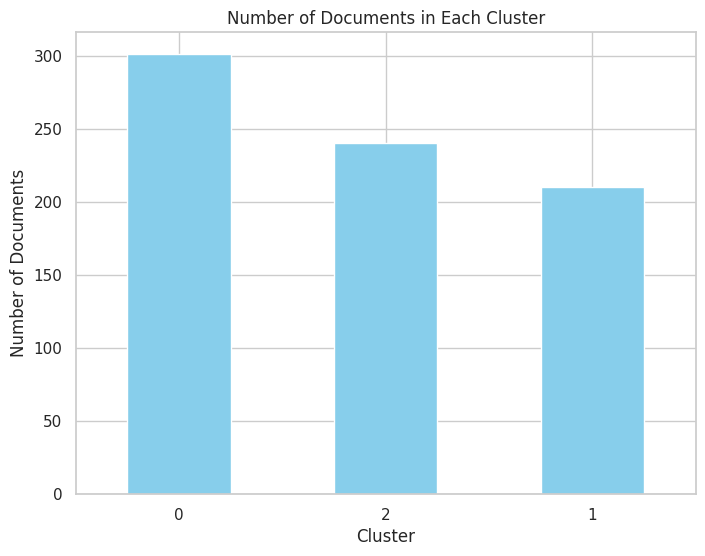

In [ ]:
# makinge a bar graph
plt.figure(figsize=(8, 6))
cluster_counts.plot(kind='bar', color='skyblue')
plt.title("Number of Documents in Each Cluster")
plt.xlabel("Cluster")
plt.ylabel("Number of Documents")
plt.xticks(rotation=0)
plt.show()

# Task 8: Dependency Parsing and Advanced Structures

This code reads sentences, analyzes their grammatical relationships, and prints out detailed information about each word’s role in the sentence. It also shows a visual diagram to make it easier to understand how words in the sentence are connected.

In [ ]:
from spacy import displacy

# Defining the function to parse a sentence and return dependency details
def analyze_dependencies(text):
    # Processing the sentence using spaCy's NLP pipeline
    doc = nlp(text)
    parsed_info = []
    for token in doc:
        parsed_info.append({
            "Word": token.text,
            "Dependency": token.dep_,
            "Head": token.head.text,
            "POS": token.pos_
        })
    # Converting the parsed information into a DataFrame
    return pd.DataFrame(parsed_info)

In [ ]:
# Printing dependency parsing for all sentences
print("Dependency Parsing Results for All Sentences:")

# Looping through all sentences in the 'LemmatizedHeadline' column
for idx, sentence in enumerate(df['LemmatizedHeadline']):
    print(f"\nSentence {idx + 1}: {sentence}")
    print(analyze_dependencies(sentence))

Streaming output truncated to the last 5000 lines.
1     solar       amod  industry   ADJ
2  industry   compound  strategy  NOUN
3  downplay   compound  strategy  NOUN
4   climate   compound  strategy  NOUN
5  strategy      appos        we  NOUN
6     trump   compound       era  NOUN
7       era      appos        we  NOUN

Sentence 374: boeing cancel workplace surveillance program remove sensor instal less day seattle times request comment leak information
            Word Dependency         Head    POS
0         boeing      nsubj       cancel  PROPN
1         cancel       ROOT       cancel   VERB
2      workplace   compound      program  PROPN
3   surveillance   compound      program   NOUN
4        program   compound       remove   NOUN
5         remove   compound       sensor   NOUN
6         sensor       dobj       cancel   NOUN
7         instal     advmod       cancel    ADJ
8           less       amod          day    ADJ
9            day   npadvmod       cancel   NOUN
10       se

In [ ]:
# Visualizing the dependency parsing for all sentences
print("\nVisualizing Dependency Structures...")

for idx, sentence in enumerate(df['LemmatizedHeadline']):
    doc = nlp(sentence)
    print(f"\nVisualizing Sentence {idx + 1}: {sentence}")
    displacy.render(doc, style="dep", jupyter=True, options={"distance": 90})


Visualizing Dependency Structures...

Visualizing Sentence 1: florida lose pornhub access



Visualizing Sentence 2: microsoft really want user ditch password switch passkey



Visualizing Sentence 3: amazon rto delay exemplify worker get mad mandate amazon lack space accommodate entire workforce



Visualizing Sentence 4: chinese cybersecurity centre accuse we hack steal tech secret



Visualizing Sentence 5: grubhub pay 25 million mislead customer restaurant driver



Visualizing Sentence 6: putin say google tool use united state



Visualizing Sentence 7: realpage pricing software add billion rental cost say white house renter we spend extra 38 billion last year allegedly due landlord price coordination



Visualizing Sentence 8: epa allow california ban gaspowere new car sale 2035



Visualizing Sentence 9: fcc business threatening take away broadcast license outgoing commissioner jessica rosenworcel



Visualizing Sentence 10: display fealty tech industry curry favor trump 1 million donation come gradually once meta amazon openais sam altman uber ceo



Visualizing Sentence 11: apple reportedly abandon plan iphoneasasubscription nowdead plan people pay monthly fee get new iphone every year



Visualizing Sentence 12: teamster union launch historic nationwide strike amazon



Visualizing Sentence 13: att hit texas man 6 000 bill use 3 gb data



Visualizing Sentence 14: trump block government military buying evs trumps attack clean vehicle big thought say report



Visualizing Sentence 15: we government urge highranke official lock mobile device follow telecom breach



Visualizing Sentence 16: att dump hybrid work follow amazon demand employee spend 5 day week office



Visualizing Sentence 17: we chemist debunk 100yearold bredts rule change organic chemistry forever



Visualizing Sentence 18: microsoft confirm ad call duty black op 6 window 11 here turn



Visualizing Sentence 19: two bestselle console we history officially nintendo switch bump ps2 third place nintendo affordability strike



Visualizing Sentence 20: we government set approve spend 3 billion remove chinese telecom equipment



Visualizing Sentence 21: apple push back metas request cite alarm privacy concern



Visualizing Sentence 22: harvard release massive free ai train dataset fund openai microsoft



Visualizing Sentence 23: dji evade we block one year prove product national security threat clause 895 billion us defense bill start oneyear countdown would automatically ban product



Visualizing Sentence 24: tplink router could ban we national security concern



Visualizing Sentence 25: balcony solar panel save 30 typical household electricity bill and vertical surface area city large roof space appeal clear



Visualizing Sentence 26: another major us hospital hack datum 14 million patient leak



Visualizing Sentence 27: sony fromsoftware owner kadokawa large shareholder form strategic capital business alliance



Visualizing Sentence 28: steve harvey death hoax aigenerate article allegedly blame



Visualizing Sentence 29: tiktok account pump fake war footage ai cbc news investigate



Visualizing Sentence 30: google street view capture man load bag trunk arrest follow



Visualizing Sentence 31: world first gridscale nuclear fusion power plant announce we



Visualizing Sentence 32: the work damage I exfacebook moderator describe effect horrific content former worker samasource say violent graphic sexually explicit video leave fearful go outside



Visualizing Sentence 33: 140 kenya facebook moderator sue diagnose severe ptsd



Visualizing Sentence 34: czech government approve national climate energy plan



Visualizing Sentence 35: wind power generation hit second record matter day



Visualizing Sentence 36: bbc news facebook restrict news palestinian territory



Visualizing Sentence 37: delusion amazon haul amazons new ultracheap discount store look lot like temu shein aliexpress



Visualizing Sentence 38: truth ai its smart datum feed



Visualizing Sentence 39: infosys cofounder repeat call 70hour work week



Visualizing Sentence 40: kid online safety act last stand



Visualizing Sentence 41: world first fertilo baby bear egg mature outside body stem cell tech fertilo offer fast safe accessible alternative conventional ivf few hormone injection reduce treatment cycle



Visualizing Sentence 42: ftcs lina khan change everything ban hide junk fee thing like hotel concert ticket



Visualizing Sentence 43: grubhub pay 25 million allegedly trick customer lie driver



Visualizing Sentence 44: pornhub block access floridian jan 1



Visualizing Sentence 45: us tech continue power russian weapon despite export controls senate democrats find



Visualizing Sentence 46: generative ai climate change collision course



Visualizing Sentence 47: energy giant use southern yellow pine power datum centre



Visualizing Sentence 48: company issue rto mandate lose good talent study



Visualizing Sentence 49: new research show ai strategically lie paper show anthropic model claude strategically mislead creator training process order avoid modify



Visualizing Sentence 50: supreme court squash big telecom attempt avoid new york states lowincome price regulation law mandate affordable internet plan lowincome household cap rate 15 20



Visualizing Sentence 51: dhs say china russia iran israel spy people we ss7



Visualizing Sentence 52: almost million connectoncall user may datum steal hacker healthcare tech suffer huge breach



Visualizing Sentence 53: need dark web drug sale flourish social medium



Visualizing Sentence 54: malicious ad push lumma infostealer via fake captcha page



Visualizing Sentence 55: we government tell official politician ditch regular call text



Visualizing Sentence 56: biden set announce chinese semiconductor probe bloomberg news



Visualizing Sentence 57: microsoft buy nearly 500 000 nvidia hopper chip year



Visualizing Sentence 58: lastpass hack user see million dollar fund steal



Visualizing Sentence 59: big loss isp supreme court will not hear challenge 15 broadband law



Visualizing Sentence 60: new microscopy technique could enable rapid tumor analysis operating room



Visualizing Sentence 61: elevate level forever chemical find several smartwatch wrist band



Visualizing Sentence 62: trump fcc chair want revoke broadcast licensesthe 1st amendment might stop brendan carr back trump war medium revoke license easy



Visualizing Sentence 63: tracker firm hapn spill name thousand gps track customer



Visualizing Sentence 64: us supreme court hear argument tiktok divestment law



Visualizing Sentence 65: supreme court hear challenge ban tiktok united state



Visualizing Sentence 66: trump security advisor urge offensive cyberattack china



Visualizing Sentence 67: third person receive transplant genetically engineer pig kidney



Visualizing Sentence 68: microsoft ceo satya nadella say google make money window microsoft due dominance search distribution



Visualizing Sentence 69: elon musk spacex face federal review violation security reporting rule



Visualizing Sentence 70: ftc officially ban hide junk fee hotel ticket price



Visualizing Sentence 71: real estate platform let resident check neighbor political affilitation



Visualizing Sentence 72: apple talk tencent bytedance roll ai feature china source say



Visualizing Sentence 73: google gemini force contractor rate ai response outside expertise



Visualizing Sentence 74: facebook restrict news palestinian territory



Visualizing Sentence 75: youtube sue gan je world accuse video site steal content create clone youtube lawsuit allege site automatically vacuum youtube user channel associate content youtube



Visualizing Sentence 76: heres blockbuster nissanhonda merger could mean auto industry



Visualizing Sentence 77: cohere quietly work palantir deploy ai model



Visualizing Sentence 78: sam altmanbacke nuclear startup oklo land massive datum center power deal caveat



Visualizing Sentence 79: salesforce hire 2 000 people sell ai product ceo marc benioff say



Visualizing Sentence 80: hundred website shut uks chill internet law



Visualizing Sentence 81: feel home new app let we homebuyer see neighbor politic



Visualizing Sentence 82: solar rush planetwide solar boom beat expectation every turn its beginning



Visualizing Sentence 83: mind blow battery cell price plunge china big energy storage auction



Visualizing Sentence 84: researcher discover new third class magnetism could transform digital device



Visualizing Sentence 85: nissan share surge 22 medium report potential merger honda



Visualizing Sentence 86: burn cash boston dynamic lie 45 employee



Visualizing Sentence 87: fbi warn americans keep text message secure know



Visualizing Sentence 88: germanys auto giant already reel trump want turn american company



Visualizing Sentence 89: zotac confirm geforce rtx 5090 32 gb gddr7 memory 5080 5070 series list well



Visualizing Sentence 90: may brink find real planet nine



Visualizing Sentence 91: electionbound germany brace russian disinformation threat



Visualizing Sentence 92: spacexs starship flight 7 test flight get faa launch license fly



Visualizing Sentence 93: honda nissan explore merger navigate uncertain ev future



Visualizing Sentence 94: possible ban chinesemade drone dismay we scientist switch costly less capable drone could impede research whale forest



Visualizing Sentence 95: ai poses threat north american electricity grid watchdog warn



Visualizing Sentence 96: trump meet tiktok ceo company ask supreme court block ban app



Visualizing Sentence 97: chinas dual 16core hygon cpu server rack barely outperform quadcore skylake core i76700hq mobile cpu geekbench ai



Visualizing Sentence 98: amazon face strike threat senate report detail hide widespread injury



Visualizing Sentence 99: big tech hope gain warming trump



Visualizing Sentence 100: wordpress user need know automattic wp engine conflict



Visualizing Sentence 101: cash app creator bob lees killer find guilty seconddegree murder



Visualizing Sentence 102: microsoft stop update million window user break game



Visualizing Sentence 103: tech executive find guilty murder cash app founder bob lee



Visualizing Sentence 104: ftc issue rule require hotel ticket seller reveal junk fee



Visualizing Sentence 105: scammer use gamifie tactic prey job seekers ftc report 220 m loss never pay someone offer job good rule thumb



Visualizing Sentence 106: iphone owner see little value apple intelligence far



Visualizing Sentence 107: meta fine 263 m 2018 security breach affect 3 m eu user



Visualizing Sentence 108: tesla top list brand high fatal accident rate new study



Visualizing Sentence 109: amazon commit another 10 billion ohio datum center amid question energy cost supply



Visualizing Sentence 110: broward judge don virtual reality headset what s think courtroom first



Visualizing Sentence 111: word stop chatgpt track



Visualizing Sentence 112: japanese startup space one fail launch rocket 2nd time



Visualizing Sentence 113: bridgy fed project connect open social web become nonprofit



Visualizing Sentence 114: national effort seek advance semiconductor research



Visualizing Sentence 115: tiktok disinformation falsely accuse von der leyen cancel romania presidential runoff



Visualizing Sentence 116: uk consult proposal give creative industry ai developer clarity copyright law



Visualizing Sentence 117: aclu partner urge supreme court block tiktok ban



Visualizing Sentence 118: system76 release update amd ryzen linux laptop



Visualizing Sentence 119: eu open investigation tiktok election interference



Visualizing Sentence 120: balatro dev swing pegi rate 18 evil playing card joke add microtransaction like ea sport fc 25 low rating 3 if game rate properly I d happily accept weirdo 18



Visualizing Sentence 121: thread start test schedule post



Visualizing Sentence 122: nvidia unveil affordable generative ai supercomputer



Visualizing Sentence 123: israeli spyware maker paragon buy we private equity giant techcrunch



Visualizing Sentence 124: texas ag sue cali tech company like instagram reddit discord



Visualizing Sentence 125: crucial discontinue popular mx500 ssd make way nextgen drive sata iii ssd retire seven year



Visualizing Sentence 126: uk propose let tech firm use copyright work train ai



Visualizing Sentence 127: fbi spot hiatusrat malware attack target web camera dvrs



Visualizing Sentence 128: test nvidia app performance problem game run 15 percent slow app



Visualizing Sentence 129: android phone maker top apple wearable and samsung



Visualizing Sentence 130: trillion ton underground hydrogen could power earth 1 000 year geologic hydrogen could lowcarbon primary energy resource



Visualizing Sentence 131: ai make universal basic income inevitable



Visualizing Sentence 132: youtube partner caa protect artist unauthorized ai use



Visualizing Sentence 133: seagate launch 32 tb exos hard drive base hamr technology mozaic 3 drive world first generally available hamr hdd



Visualizing Sentence 134: congo file criminal complaint apple europe conflict mineral



Visualizing Sentence 135: openai hope sever nonprofit root maker chatgpt battle google meta ai supremacy its also fight end control nonprofit board



Visualizing Sentence 136: flipboard launch surf new app can not access cause one cool kid



Visualizing Sentence 137: nvidia fall deep correction territory broadcom rally continue



Visualizing Sentence 138: it need cash cybersecurity whistleblower earn big payout fraud case bring we government



Visualizing Sentence 139: hacker jailbreak digital license plate make other pay toll ticket



Visualizing Sentence 140: lisa kudrow say tom hanks movie an endorsement ai



Visualizing Sentence 141: trump transition team plan sweeping rollback biden ev emission policy



Visualizing Sentence 142: kosa bad bill rearrange word will not change that



Visualizing Sentence 143: klarna ceo say company stop hire year ago ai can already job



Visualizing Sentence 144: 2024 scienceorg breakthrough year winner nine runner up



Visualizing Sentence 145: europe starlink competitor go 290 iris satellite 2030 provide secure connectivity governmental user well private company european citizen



Visualizing Sentence 146: japan drop mantra reduce nuclear dependency new draft plan



Visualizing Sentence 147: box open experimentation usyk2fury fight monitor ai referee



Visualizing Sentence 148: russia plan euv chipmake tool say cheap easy build asmls country outline new roadmap small chip



Visualizing Sentence 149: waymo robotaxis come tokyo 2025 techcrunch



Visualizing Sentence 150: log wordpress agree pineapple pizza good



Visualizing Sentence 151: waymo begin test tokyo first international destination



Visualizing Sentence 152: artificial intelligence improve mammographybase breast cancer risk prediction



Visualizing Sentence 153: chinas ai elite rethink silicon valley dream job



Visualizing Sentence 154: facebookparent meta settle australias privacy watchdog cambridge analytica lawsuit



Visualizing Sentence 155: minuscule robot target drug delivery



Visualizing Sentence 156: gofundme pull luigi mangione fundraiser another platform feature one front page



Visualizing Sentence 157: 2 000plus dead rocket orbithere rare view one japanese company become first approach piece space junk lowearth orbit



Visualizing Sentence 158: tiktok file emergency appeal supreme court seek block we ban



Visualizing Sentence 159: ai use turn teen photo nude image teen fighting change protect kid



Visualizing Sentence 160: serbian police use cellebrite unlock plant spyware journalist phone techcrunch



Visualizing Sentence 161: blackmagic vision pro camera available preorder cost 30 000



Visualizing Sentence 162: google search could soon let attach ask anything file



Visualizing Sentence 163: ingram micro stop business broadcom downgrade limited engagement vmware



Visualizing Sentence 164: lfgss shut 16th march 2025 day online safety act enforce



Visualizing Sentence 165: shapechange device help people visual impairment perform location task



Visualizing Sentence 166: fast well way train generalpurpose robot



Visualizing Sentence 167: verizon nvidia unveil aipowere private 5 g network solution enterprise



Visualizing Sentence 168: ai outrage errorriddle indigenous language guide real harm advocate say



Visualizing Sentence 169: fed urge deploy hightech drone hunter solve mystery behind sight



Visualizing Sentence 170: florida spend 15 million school material review technology desantis law



Visualizing Sentence 171: meta ai propose large concept model lcms semantic leap beyond tokenbased language modeling



Visualizing Sentence 172: russialinke hacker target polish election disinformation blitz report



Visualizing Sentence 173: fbi say text be not secure need stop



Visualizing Sentence 174: two arrest hazardous drone operation near boston airport



Visualizing Sentence 175: I receive first feel taint undeserved inside university ai cheat crisis



Visualizing Sentence 176: samsung tsmc lock intense 2 nm chip competition



Visualizing Sentence 177: researcher develop ultrathin film power wearable use body heat



Visualizing Sentence 178: exgoogle ceo warn there s time consider unplug ai system



Visualizing Sentence 179: big tech new ai obsession agent work ai agent go beyond chatbot this really rise digital labor



Visualizing Sentence 180: uk internet watchdog give social medium company three month improve safety face huge fine ofcom issue fine 23 million 10 percent company global revenue



Visualizing Sentence 181: automaker thrive pandemic many struggle



Visualizing Sentence 182: teen abandon x facebook tiktok whatsapp gain momentum report



Visualizing Sentence 183: fintech company collapse take 90 million people life save



Visualizing Sentence 184: dexcom overthecounter glucose monitor offer user ai summary sleep meal impact sugar level



Visualizing Sentence 185: man become famous 20 year ago star war kid say digital shadow define



Visualizing Sentence 186: desert festival robot headliner



Visualizing Sentence 187: we need make cyber attacker pay trump adviser say



Visualizing Sentence 188: technology actually run world dominant algorithm be not one choose song spotify serve



Visualizing Sentence 189: researcher stanford university propose smoothie machine learn algorithm learn labelfree router generative task



Visualizing Sentence 190: instagram head say social medium need context ai series post adam mosseri remind user consider source believe other post



Visualizing Sentence 191: microsoft critical window defender security vulnerability



Visualizing Sentence 192: there s budget geforce gpu sell china even nvidia know make rtx 4010 turn modify rtx a400 workstation gpu



Visualizing Sentence 193: big tech scour globe search cheap energy



Visualizing Sentence 194: new jersey drone mystery may actually mysterious



Visualizing Sentence 195: snapchat overhaul influencer earn money platform



Visualizing Sentence 196: openai whistleblower suchir balajis death rule suicide



Visualizing Sentence 197: tech billionaire zuckerberg bezos altman help bankroll trump inauguration know



Visualizing Sentence 198: renewable energy boom remake american west



Visualizing Sentence 199: epidemic vicious school brawl fuel student cellphone



Visualizing Sentence 200: ai could make scientist less creative new study examine 68 million scientific paper show use ai boost researcher career narrow question ask



Visualizing Sentence 201: skecher draw backlash fullpage ad vogue reek ai you actually do not save money hate you



Visualizing Sentence 202: google big sleep ai project uncover real software vulnerability



Visualizing Sentence 203: music tell story live trusty old lastfm well gaudy spotify wrap



Visualizing Sentence 204: rhode islands online benefit system shut cyberattack ribridge give access benefit like medicare snap well rhode islands healthcare marketplace website



Visualizing Sentence 205: 1 6 congresswoman target aigenerate sexually explicit deepfake



Visualizing Sentence 206: 23andme must secure dna database immediately



Visualizing Sentence 207: researcher develop new device enable small drone shoot powerful laser something think impossible



Visualizing Sentence 208: tmobile invite user betatest cellular starlink service



Visualizing Sentence 209: do not get apartment aigenerate score sue help other avoid fate



Visualizing Sentence 210: google tv stop find new place show advertising



Visualizing Sentence 211: new app let police identify suspects street



Visualizing Sentence 212: dual intel arc b580 pc detail share use alongside nvidia titan xp fast fluidx3d simulation



Visualizing Sentence 213: tech leader ai visionary endlessly curious jensen huang keynote ces 2025



Visualizing Sentence 214: mark zuckerberg say thread 100 million daily active user



Visualizing Sentence 215: silicon valley disrupt democracy



Visualizing Sentence 216: hdmi 22 set debut ce 2025 new standard bring high resolution refresh rate bandwidth



Visualizing Sentence 217: amazon pause 1bn microsoft 365 rollout follow russian security concern



Visualizing Sentence 218: snapdragon x elite laptops high return rate claim intel coceo



Visualizing Sentence 219: spacecraft make dare approach metal object earth orbit mashable



Visualizing Sentence 220: openai whistleblower find dead san francisco apartment suchir balaji 26 claim company break copyright law



Visualizing Sentence 221: we patch loophole allow china buy ban ai gpu country new regulation include national quota gpu export global licensing system we want set national quota gpu export



Visualizing Sentence 222: us court reject tiktok request temporarily halt pende we ban



Visualizing Sentence 223: landmark law prohibit health insurance company use ai deny healthcare coverage



Visualizing Sentence 224: spacex want turn texas launch site city all goal make south texas gateway mar starbase gm



Visualizing Sentence 225: tech company threaten trump donate inauguration fund



Visualizing Sentence 226: ai strengthen democracy



Visualizing Sentence 227: shapeshifte antenna take cue the expanse inspire scifi show device morph suit signal



Visualizing Sentence 228: openai whistleblower find dead san francisco apartment



Visualizing Sentence 229: belgium construct world first artificial island harness offshore wind



Visualizing Sentence 230: us china renew science technology pact amid grow rivalry



Visualizing Sentence 231: trump dine apple tim cook maralago friday bloomberg



Visualizing Sentence 232: broadcom say vmware well moneymake machine hope



Visualizing Sentence 233: openais altman donate 1 million trumps inaugural fund



Visualizing Sentence 234: yearlong supplychain attack target security pro steal 390k credential



Visualizing Sentence 235: microsoft confirm password deletion 1 billion usersattack 200



Visualizing Sentence 236: meta urge california attorney general stop openai become forprofit



Visualizing Sentence 237: biden administration say allow california ban new gaspowere car



Visualizing Sentence 238: trump transition want scrap crash reporting requirement oppose tesla



Visualizing Sentence 239: unitedhealth optum leave ai chatbot use employee ask question claim expose internet



Visualizing Sentence 240: faircado revolutionize secondhand shopping ai



Visualizing Sentence 241: trouble search google the good



Visualizing Sentence 242: police use ai transcribe bodycamera video civil right group concern



Visualizing Sentence 243: openai cofounder ilya sutskever believe superintelligent ai unpredictable



Visualizing Sentence 244: noninvasive imaging method penetrate deep living tissue use highpowere laser new method could help biologist study bodys immune response develop new medicine



Visualizing Sentence 245: cyborg cockroach massproduce robotic factory pleasant dream south china morning post



Visualizing Sentence 246: court deny tiktok bid pause we ban set jan 19



Visualizing Sentence 247: amazon worker authorize strike company firstever unionized warehouse



Visualizing Sentence 248: apple google instruct house committee prepare dump tiktok next month



Visualizing Sentence 249: look love sex tinder soldier endanger national security



Visualizing Sentence 250: mexico use aipowere app prevent suicide detect small change behavior pattern contribute 9 decrease suicide



Visualizing Sentence 251: bbc complain apple mislead shoot headline



Visualizing Sentence 252: ai gpu cluster one million gpu plan 2027 broadcom say three ai supercomputer work



Visualizing Sentence 253: tech moguls altman bezos zuckerberg donate trumps inauguration fund



Visualizing Sentence 254: microsoft recall capture screenshot sensitive information like credit card social security number privacy nightmare real perfectly avoidable disable feature good



Visualizing Sentence 255: do not use crypto cheat taxi bitcoin bro get 2 year



Visualizing Sentence 256: reddit remove link luigi mangione manifesto company say its enforce longrunne policy



Visualizing Sentence 257: apple may work custom ai server chip broadcom help



Visualizing Sentence 258: bbc say complain apple aigenerate fake news attribute broadcaster notifications new apple product falsely suggest bbc claim new york gunman luigi mangione kill



Visualizing Sentence 259: exist ev battery may last 40 long expect



Visualizing Sentence 260: japanese brewery make space sake aim moon next



Visualizing Sentence 261: bc city turn ai speed housing approval



Visualizing Sentence 262: we military talk openly go attack space we build capability provide leadership offensive defensive option



Visualizing Sentence 263: tsmc say first advance us chip fab dang near back schedule here inside look



Visualizing Sentence 264: intel coceo claim retailer say qualcommpowere pc high return rate point new competitor arm chip come 2025



Visualizing Sentence 265: unidentified drone spot we air base germany report say



Visualizing Sentence 266: new device produce critical fertilizer ingredient thin air



Visualizing Sentence 267: controversial eu ad campaign x break blocs privacy rule



Visualizing Sentence 268: xs lastminute update kid online safety act still fail protect kidsor adultsonline



Visualizing Sentence 269: witcher 4 trailer debut render nvidia rtx 5000serie gpu unreal engine 5 surprise



Visualizing Sentence 270: ai help telegram remove 15 million suspect group channel 2024



Visualizing Sentence 271: tumblr add redditlike community



Visualizing Sentence 272: nvidia revive lan party 13 year celebrate rtx 50series gpu launch geforce lan 50 50hour lan party across four different city



Visualizing Sentence 273: ais emission skyrocket even



Visualizing Sentence 274: bluesky hit 25 m user exodus x continue



Visualizing Sentence 275: unprecedented risk life earth scientist call halt mirror life microbe research science



Visualizing Sentence 276: turkey fine google 75 million violating competition law



Visualizing Sentence 277: waymos robotaxis pass first responder test



Visualizing Sentence 278: trumps pick ftc chair ready undo good thing lina khan



Visualizing Sentence 279: drone new jersey despite sight we skeptical drone report least 10 county state white house spokesman suggest many actually man aircraft



Visualizing Sentence 280: youtube tv hike price 10 8299



Visualizing Sentence 281: microsoft recall screenshot credit card social security number even sensitive information filter enable



Visualizing Sentence 282: critical wordpress plugin vulnerability active exploit threaten thousand vulnerability severity rating 98 possible 10 still live 8 000 site



Visualizing Sentence 283: kid rare genetic disorder customize crispr treatment offer hope



Visualizing Sentence 284: naloxone highly effective antidote canadas toxic drug crisis here work



Visualizing Sentence 285: sundar pichai jeff bezos head maralago schmooze trump



Visualizing Sentence 286: intel arc b580 review new 249 gpu champion arrive



Visualizing Sentence 287: ai enters congress sexually explicit deepfake target woman lawmaker



Visualizing Sentence 288: klarna stop hire year ago replace worker ai



Visualizing Sentence 289: firefox one first do track supporter long offer



Visualizing Sentence 290: see demo new ai system power anduril vision war be live first drone war ai poise change future warfare even drastically



Visualizing Sentence 291: aclu condemn police use ai draft report



Visualizing Sentence 292: blumenthal blatant hypocrisy praise musk free speech support censorial kosa bill



Visualizing Sentence 293: generate power thin flexible thermoelectric film device could integrate clothing harvest body heat power gadget



Visualizing Sentence 294: mark zuckerbergs meta donate 1 million trumps inaugural fund wall street journal



Visualizing Sentence 295: lead ai company get lousy grade safety new report future life institute give mostly ds f



Visualizing Sentence 296: googles notebooklm let talk ai podcast host techcrunch



Visualizing Sentence 297: fbi say answer drone see new jersey



Visualizing Sentence 298: porn viewer want demure tradwife content year pornhub tradwife search 72 percent interest mormon content specifically big increase year



Visualizing Sentence 299: youtube enhance comment section aigenerate nonsense



Visualizing Sentence 300: russia take unusual route hack starlinkconnecte device ukraine



Visualizing Sentence 301: controversial plan refreeze arctic see promising result scientist warn big risk



Visualizing Sentence 302: two nanometre cmos technology



Visualizing Sentence 303: homeland security share new detail mysterious drone flight new jersey



Visualizing Sentence 304: company try stop online support ceo killer suspect



Visualizing Sentence 305: harvard make 1 million book available train ai model



Visualizing Sentence 306: sure look like openai train sora game content legal expert say could problem



Visualizing Sentence 307: optical disc onslaught continue lg quit bluray player



Visualizing Sentence 308: microsoft quietly axe skype credit phone number sale push subscription



Visualizing Sentence 309: ai agent autonomy chatbot come safety expert worry



Visualizing Sentence 310: tsmc lift curtain nanosheet transistor



Visualizing Sentence 311: fishinspire sensor touch use electric field



Visualizing Sentence 312: two teen indict create hundred deepfake porn image classmate



Visualizing Sentence 313: we online gambling loss surpass 1 trillion 2028 group say



Visualizing Sentence 314: use airtag expedite lose luggage reunion united mobile app



Visualizing Sentence 315: fcc throw open 6 ghz band unlicensed lowpower gizmo



Visualizing Sentence 316: strange logic behind nycs push force license plate electric bicycle



Visualizing Sentence 317: beware job offer via text ftc say task scams skyrocket



Visualizing Sentence 318: call record steal att verizon probably will not tell you



Visualizing Sentence 319: meta donate 1 million trump inaugural fund late step mend relationship



Visualizing Sentence 320: pentagon say mystery drones new jersey not us military likely foreign techcrunch



Visualizing Sentence 321: odd bit propaganda belarus claim starlink technology



Visualizing Sentence 322: youtube tv price rise 10 month reach 8299



Visualizing Sentence 323: encryption nonnegotiable open letter eu undermine privacy



Visualizing Sentence 324: mysterious suvsized drone may block medical helicopter local police continue report unidentified aerial vehicle across pennsylvania new jersey new york



Visualizing Sentence 325: greece introduce social medium restriction young user



Visualizing Sentence 326: lg stop make bluray player mark end era limit unit remain inventory last digital streaming displace last remnant physical medium



Visualizing Sentence 327: discovery new cyclic lipodepsipeptide orfamide n via partnership middle school student boy girl club



Visualizing Sentence 328: synthetic biology expert outline path engineering mirror life highlight grave risk urge never do



Visualizing Sentence 329: wga call studio take immediate legal action ai company use subtitle train model



Visualizing Sentence 330: training machine mimic human



Visualizing Sentence 331: pika 20 launch let upload character ai video



Visualizing Sentence 332: we firm beat microsoft harvard 50 entangle logical qubit quantum computer record tumble month company race build fault tolerant quantum computer



Visualizing Sentence 333: incoming ftc chair stop investigation falsely claim politically motivated launch politically motivate investigation



Visualizing Sentence 334: indian police demand starlink reveal buyer device find 42 billion drug bust smuggler catch 13 227 pound meth



Visualizing Sentence 335: us cap country advance chip access china sight source



Visualizing Sentence 336: japanese publisher kadokawa pay 3 million russialinke hacker group cyberattack



Visualizing Sentence 337: x gain fast grok model new grok button



Visualizing Sentence 338: misinformation spread differently content facebook 2020 election



Visualizing Sentence 339: google samsung vr ar glass announce



Visualizing Sentence 340: google announce android xr new os headset smart glass



Visualizing Sentence 341: meta tiktok google force pay australian news



Visualizing Sentence 342: nasa video show next martian helicopter soar mar



Visualizing Sentence 343: operator behind four major neonazi x account



Visualizing Sentence 344: report google tell ftc microsoft openai deal kill ai competition



Visualizing Sentence 345: instagram facebook whatsapp thread currently major meta outage



Visualizing Sentence 346: russia test cut access global web vpns can not get around



Visualizing Sentence 347: bereal accuse annoying user share datum



Visualizing Sentence 348: quantum entanglement oil coal power new kind engine



Visualizing Sentence 349: sure look like openai train sora game content legal expert say could problem



Visualizing Sentence 350: block chinese spy intercept call sen wyden blast fccs failure amid salt typhoon hack



Visualizing Sentence 351: pentagon announce new ai office look deploy autonomous weapon



Visualizing Sentence 352: judge reject sale alex jones infowars onion dispute bankruptcy auction



Visualizing Sentence 353: jared isaacman us space competitiveness we can not second



Visualizing Sentence 354: australia demand big social platform pay local news publisher



Visualizing Sentence 355: nvidia deny rumor cut supply china



Visualizing Sentence 356: amazon start sell hyundai car brand next year amazon auto go live 48 us city



Visualizing Sentence 357: youtube say viewer stream 1 billion hour daily living room 2024



Visualizing Sentence 358: third humanity play video game mean planet



Visualizing Sentence 359: google unveils mixedreality headset samsung take apple meta



Visualizing Sentence 360: trump may split americas cyber agency



Visualizing Sentence 361: chinas scifi spherical death starlike robot cop use ai facial recognition track criminal



Visualizing Sentence 362: startup brick 800 emotional support robot kid without refund embody say try refund recent purchase make promise



Visualizing Sentence 363: epic dream starting come true store preinstalle million android phone



Visualizing Sentence 364: steam beat concurrent player record whop 392 million one time big launch thank



Visualizing Sentence 365: suspect ceos kill discuss health struggle reddit



Visualizing Sentence 366: wyden propose bill secure we telecom salt typhoon hack



Visualizing Sentence 367: tech billionaire prepare invade pentagon



Visualizing Sentence 368: designer baby teenager nowand need therapy



Visualizing Sentence 369: palmer luckey defense tech company make nextgen military aircraft archer hybrid vertical takeoff landing aircraft



Visualizing Sentence 370: intel executive say manufacture spinoff possible



Visualizing Sentence 371: chatbot encourage teen kill parent screen time limit



Visualizing Sentence 372: open source maintainer drown junk bug report write ai



Visualizing Sentence 373: we solar industry downplay climate strategy trump era



Visualizing Sentence 374: boeing cancel workplace surveillance program remove sensor instal less day seattle times request comment leak information



Visualizing Sentence 375: ibm boast industryleade photonic cut ai training speed



Visualizing Sentence 376: facebook global ad revenue poise top 100b 2024 report



Visualizing Sentence 377: fujitsu flaunt massive 144core monaka arm chip 2 nm 5 nm chiplet 3dstacked cpu core memory



Visualizing Sentence 378: bc lawsuit claim electronic art video game loot box deceptive



Visualizing Sentence 379: trumps doj secretly obtain phone text message log 43 congressional staffer 2 member congress



Visualizing Sentence 380: philippine construct 3bn world large integrate solarbattery facility



Visualizing Sentence 381: government disturb rationale ban tiktok vague nationalsecurity concern do not justify shut popular chineseowne app



Visualizing Sentence 382: valve sell refurbish steam deck ole start 439



Visualizing Sentence 383: facebook instagram thread verge



Visualizing Sentence 384: world1st tubular mini intestine craft japan researchers human ips cell



Visualizing Sentence 385: gm give cruise robotaxis pivot personal autonomous vehicle



Visualizing Sentence 386: microsoft allow window 11 installation unsupported hardware device



Visualizing Sentence 387: promise early datum triple negative breast cancer new bispecific heat



Visualizing Sentence 388: krispy kreme late report cyberattack that s hamper business



Visualizing Sentence 389: peertube opensource youtube mobile app



Visualizing Sentence 390: hong kong police consider use drone patrol rule review



Visualizing Sentence 391: propose merger kroger albertson halt federal state judge



Visualizing Sentence 392: we military ground entire osprey tiltrotor fleet



Visualizing Sentence 393: microsoft give altspace shortcut copilot



Visualizing Sentence 394: supreme court dismiss nvidias security fraud appeal



Visualizing Sentence 395: become anyone 20 lead display facechange mask live name



Visualizing Sentence 396: mozilla remove track option firefox 135



Visualizing Sentence 397: major leak million americans risk holiday season



Visualizing Sentence 398: conspiracy theory overwhelm reserve bank submission



Visualizing Sentence 399: apple hit 12b lawsuit kill controversial csamdetecting tool apple knowingly ignore child porn neverende nightmare lawsuit say



Visualizing Sentence 400: cruise employee blindside gms plan end robotaxi program



Visualizing Sentence 401: 72pc account spread antibangladesh misinformation locate india rumor scanner



Visualizing Sentence 402: hand project astra google seeall assistant



Visualizing Sentence 403: tiktok price record 300 billion one analyst say



Visualizing Sentence 404: gpu antitrust



Visualizing Sentence 405: google step mcdonald get review bomb arrest unitedhealth ceo murder



Visualizing Sentence 406: watch chinese security robot wheel foot scramble hill perform acrobatic wheel choice two leg four deep robotic lynx capable traverse tough terrain



Visualizing Sentence 407: cryptos legacy finally clear



Visualizing Sentence 408: nvidia powerful beijing constrain



Visualizing Sentence 409: onlyfan model use ai impersonator keep dm



Visualizing Sentence 410: spotifys car thing accessory officially dead



Visualizing Sentence 411: no microsoft will not let install window 11 unsupported pc



Visualizing Sentence 412: gm halt funding robotaxi development cruise



Visualizing Sentence 413: intel arc b580 battlemage gpu openclvulkan performance leak out 9 30 fast a580



Visualizing Sentence 414: open source maintainer drown junk bug report write ai python security developerinresidence decrie use bot can not understand code



Visualizing Sentence 415: nasa say moon mission delay hope land astronaut china



Visualizing Sentence 416: wordpress parent company must stop block wp engine judge rule



Visualizing Sentence 417: blame game government bank tech company foot bill cyber scam



Visualizing Sentence 418: ai boom threaten shortcircuit climate action



Visualizing Sentence 419: apple reveal new ai chip building partner amazon



Visualizing Sentence 420: social medium grow vehicle climate misinformation



Visualizing Sentence 421: alarming amount texas instrument chip find russianbase weapon ukraine russian military use third party purchase usmade chip us texas instrument struggle crack slippery russianbound shipment



Visualizing Sentence 422: tesla lobby uk strengthen rule carbon emission car lorry tesla



Visualizing Sentence 423: google ask ftc break microsoft cloud deal openai information say



Visualizing Sentence 424: russiabacke influencer meddle romania vote presidential election annul illegal social medium campaign deploy 100 pay influencer 8 million follower tiktok meta platform



Visualizing Sentence 425: former intel ceo pat gelsinger call prayer fast employee



Visualizing Sentence 426: wp engine win preliminary injunction wordpress legal battle judgement temporarily force automattic restore wpengine access wordpressorg



Visualizing Sentence 427: chatbot urge teen selfharm suggest murder parent lawsuit say



Visualizing Sentence 428: future anxiety relief psychedelic minus hallucinogenic effect



Visualizing Sentence 429: salt typhoon record very senior us official call



Visualizing Sentence 430: google claim new willow quantum chip swiftly solve problem would take standard supercomputer 10 septillion year



Visualizing Sentence 431: 6 billion chip act funding finalize micron plant us us commerce department say micron idaho new york plant create around 20 000 job



Visualizing Sentence 432: x bluesky people flee elon musk digital town square



Visualizing Sentence 433: cap intel annus horribilis time pick amds dr lisa su ceo year definitely well choice last year pick that s sure



Visualizing Sentence 434: software engineer mapping license plate reader nationwide I do not like track



Visualizing Sentence 435: location datum firm help police find suspect visit doctor



Visualizing Sentence 436: wordpress must stop block wp engine judge rule



Visualizing Sentence 437: microsoft 365 outage take office web app admin center



Visualizing Sentence 438: tesla sue decease driver family fraudulent misrepresentation autopilot safety



Visualizing Sentence 439: notsosubtle signal regulator blue origin say new glenn ready



Visualizing Sentence 440: game publisher refuse commit release date fear clash gta 6 probably good idea



Visualizing Sentence 441: gm stop develop selfdrive taxi



Visualizing Sentence 442: 3dprinted ghost gun discover suspect connection brian thompson assassination



Visualizing Sentence 443: microsoft uturn window 11 tpm requirement day double



Visualizing Sentence 444: mozilla firefox remove do track feature support here mean privacy



Visualizing Sentence 445: google release first gemini 20 ai model



Visualizing Sentence 446: video ais new frontier persuasive worry try sora openais new tool leave sad ready world never tell real



Visualizing Sentence 447: phone company develop ai granny beat scammer game



Visualizing Sentence 448: cable isp compare data cap food menu do not make we offer unlimited soup datum plan compare taste menu buffet unlimited soup salad



Visualizing Sentence 449: bionic leg control brain



Visualizing Sentence 450: astronomer discover one fastestspinne star universe



Visualizing Sentence 451: quantumscape release nextgeneration solidstate battery separator equipment cobra



Visualizing Sentence 452: iphone update bring controversial ai feature let make picture friend



Visualizing Sentence 453: telegrams cyber attack ukraine hide plain sight



Visualizing Sentence 454: diamond create scratch lab 15 minute



Visualizing Sentence 455: biden launch we chipmake boom job boost come trump



Visualizing Sentence 456: paul mccartney warn ai could take over uk debate copyright law



Visualizing Sentence 457: apple next ultra smartwatch able send text via satellite



Visualizing Sentence 458: tcl tvs use film make generative ai push target ad



Visualizing Sentence 459: chatgpt catch lie developer new ai model try save replace shut



Visualizing Sentence 460: microsoft start test iphone file share window pc



Visualizing Sentence 461: ftc distribute 72 m fortnite customer trick make unwanted purchase



Visualizing Sentence 462: fab fab 7b question intel



Visualizing Sentence 463: yet official world small arcade machine guess game play



Visualizing Sentence 464: peter thiel network rightwe techie infiltrate donald trumps white house



Visualizing Sentence 465: apple iphone hit fbi warning lawsuit io 182 release



Visualizing Sentence 466: mischievous yakuza like dragon fan trick google map include video game series iconic millennium tower rooftop tourist attraction real world tokyo map



Visualizing Sentence 467: apple launch chatgpt integration siri



Visualizing Sentence 468: tiktok file emergency injunction late bid stall we ban



Visualizing Sentence 469: dodge maker stellantis chinas catl team build 43 billion ev battery plant spain



Visualizing Sentence 470: ftc refund 72 million fortnite player unwanted purchase player get money back fortnite skin ftc claim player pressure buy



Visualizing Sentence 471: microsoft allow window 11 old incompatible pc



Visualizing Sentence 472: we finalize 61 billion chip subsidy micron technology



Visualizing Sentence 473: ai slop already invade oregon local journalism



Visualizing Sentence 474: nvidia forge deal american southwest southeastern asia



Visualizing Sentence 475: thermal battery could replace lithiumion battery energy storage



Visualizing Sentence 476: eu cybersecurity rule smart device enter force



Visualizing Sentence 477: california police use ai transcribe body cam video



Visualizing Sentence 478: mercede work solar paint could drastically reduce need charging



Visualizing Sentence 479: googles quantum chip solve impossible problem five minute



Visualizing Sentence 480: ai revolution run datum researcher do



Visualizing Sentence 481: sick americans say they re turn tiktoks creator reward program crowdfund medical bill public outrage grow us healthcare system social medium creator say they re use tiktok payout 1 per 1 000 view raise money treatment cost



Visualizing Sentence 482: google unveils project mariner ai agent use web techcrunch



Visualizing Sentence 483: russias military find surprisingly simple way buy we chip



Visualizing Sentence 484: interview diamond may computer good friend



Visualizing Sentence 485: microsoft unveil zerowater datum center reduce ai climate impact



Visualizing Sentence 486: jr east launch scanfree ticket gate app user within 10 yrs



Visualizing Sentence 487: russia team bric create ai alliance



Visualizing Sentence 488: intel focus ai rather chipmake tsmc founder say



Visualizing Sentence 489: ransomware attack hit lead heart surgery device maker



Visualizing Sentence 490: spy student device school aim intercept selfharm happen new technology alert school student type word relate suicide



Visualizing Sentence 491: tiktok offer cash user recruit friend ahead us ban



Visualizing Sentence 492: google unveil mindboggle quantum compute chip



Visualizing Sentence 493: google claim quantum compute milestone tech can not solve realworld problem yet



Visualizing Sentence 494: researcher design new shapechange device visually impair



Visualizing Sentence 495: youtube automatically dub video



Visualizing Sentence 496: surrey announce world first ai model nearinstant image creation consumergrade hardware



Visualizing Sentence 497: linkedin want tiktok era



Visualizing Sentence 498: one world rich man avoid 8 billion taxi nvidia ceo jensen huang do magnificent job use tax strategy ubiquitous among ultrawealthy



Visualizing Sentence 499: china target nvidia antitrust probe escalate we chip tension



Visualizing Sentence 500: sap say genai help solve legacy migration skill shortage 2027 support deadline loom german vendor put faith ontrend tech help sis less



Visualizing Sentence 501: can not make stuff up tech company palantir anduril form fellowship ai adventure meanwhile sauron secure fund really



Visualizing Sentence 502: new kosa old kosa elon ignorant endorsement



Visualizing Sentence 503: nato plan deploy sea drone monitor protect undersea cable admiral expect drone fleet patrol begin june 2025



Visualizing Sentence 504: tiktok ask court pause law could shut app we next month



Visualizing Sentence 505: tiktok file emergency motion stop we ban brand creator eye door instagram reel youtube short poise capitalise migration



Visualizing Sentence 506: google ceo ai development finally slow downthe lowhange fruit go



Visualizing Sentence 507: returntowork mandate invisible pay cut



Visualizing Sentence 508: israeli wave energy project draw interest qatar saudi arabia even iran



Visualizing Sentence 509: chinese insider steal datum scoop president xis national surveillance system



Visualizing Sentence 510: chinese carmaker take mexico storm eye we



Visualizing Sentence 511: we say chinese hacker still lurk american phone network



Visualizing Sentence 512: age chiplet upon we ee times



Visualizing Sentence 513: popular science declare vision pro gadget year



Visualizing Sentence 514: quantum computer cross critical error threshold quanta magazine



Visualizing Sentence 515: chinas explosive ironmaking breakthrough achieve 3 600fold productivity boost



Visualizing Sentence 516: ai robot companion kid go dark company shutter



Visualizing Sentence 517: nvidia shares slide china launches probe suspect antimonopoly violation



Visualizing Sentence 518: google say new quantum chip indicate multiple universe exist



Visualizing Sentence 519: covert facebook network find target romanian voter



Visualizing Sentence 520: chinas chip make show progress new euv patent despite we sanction



Visualizing Sentence 521: spotify disabled car thing stream device



Visualizing Sentence 522: oceanographer record large predation event ever observe ocean



Visualizing Sentence 523: late james webb data hint new physics universe expansion late find support hubble space telescope prior expansion rate measurement



Visualizing Sentence 524: china target nvidia potential breach antimonopoly law



Visualizing Sentence 525: google say crack quantum computing challenge new chip



Visualizing Sentence 526: badass russian techie outsmart fsb flee putinland track spyware



Visualizing Sentence 527: marco grossi man behind success ilovepdf company cut paste compress solve everything universe document format brainchild design student barcelona today employ 43 people website one 50 visit world



Visualizing Sentence 528: google invest intersect power 800 million funding round amid ai race



Visualizing Sentence 529: rheinmetall auterion develop standardized software military drone



Visualizing Sentence 530: my name taqqiq read text microsoft translator add inuktitut texttospeech



Visualizing Sentence 531: 25 million unitedhealth ceo whine social medium trashing industry



Visualizing Sentence 532: ai become conscious scientist say its time plan researcher call technology company test system consciousness create ai welfare policy



Visualizing Sentence 533: a truly remarkable breakthrough google new quantum chip achieve accuracy milestone



Visualizing Sentence 534: apple sue fail implement tool would detect csam icloud



Visualizing Sentence 535: it explain ability focus go hell screen assault stone age brain information handle



Visualizing Sentence 536: reddit test conversational ai search tool techcrunch



Visualizing Sentence 537: switch 2 accessory maker pull trailer show blurry mockup nintendo next console design



Visualizing Sentence 538: scientist discover new way make fuel water sunlight work need



Visualizing Sentence 539: unitedhealthcare fire use ai deny medicare claim



Visualizing Sentence 540: inside company help america big health insurer deny coverage treatment



Visualizing Sentence 541: spacex provide ukraine wide access militarise version starlink pentagon request bloomberg



Visualizing Sentence 542: linux preps kunpeng arm server soc high bandwidth memory



Visualizing Sentence 543: social medium see suspect unitedhealthcare ceo kill folk hero what s disturb its mainstream ncri senior adviser



Visualizing Sentence 544: ai turn live truman show



Visualizing Sentence 545: google legal trouble could hasten firefoxs slide irrelevance



Visualizing Sentence 546: evs 228 share germany volkswagen group dominate home ground



Visualizing Sentence 547: reddit debut aipowere discussion searchbut user like it



Visualizing Sentence 548: romania election result annul system see 85 000 cyberattack twist saga leak credential pay influencer



Visualizing Sentence 549: year ceo shoot lawsuit allege uhc use ai deny coverage



Visualizing Sentence 550: japan spend 2 million ai squash anime piracy



Visualizing Sentence 551: ukraine weighs telegram security risk amid war russia



Visualizing Sentence 552: we critical infrastructure hit new group scene



Visualizing Sentence 553: chinas ironmaking breakthrough achieve 3 600fold productivity boost



Visualizing Sentence 554: black op 6 zombie voice actor quit protest amid excessive ai usage



Visualizing Sentence 555: nvidia almost produce x86 cpu rival amd intel force move arm due certain legal issue



Visualizing Sentence 556: meta launch open source llama 33 shrink powerful big model small size



Visualizing Sentence 557: us house vote provide 3 billion remove chinese telecom equipment



Visualizing Sentence 558: ghost gun legal brian thompson shoot



Visualizing Sentence 559: nvidia face china antitrust investigation



Visualizing Sentence 560: reveal operator behind four major neonazi x account



Visualizing Sentence 561: internet plan come nutrition label one know read they



Visualizing Sentence 562: china open antitrust investigation nvidia verge



Visualizing Sentence 563: nobel recipient geoffrey hinton wish think ai safety soon



Visualizing Sentence 564: teen create memecoin dump it earn 50 000 unsurprisingly family doxe angry trader



Visualizing Sentence 565: huge hack we phone company mean text message may safe



Visualizing Sentence 566: landlord use ai raise rentsand city start push back



Visualizing Sentence 567: nvidia stock tumbles news china investigation ai chip giant trouble



Visualizing Sentence 568: openai employee question ethic military deal startup anduril



Visualizing Sentence 569: lord ringtone nokia celebrates popculture status open design archive



Visualizing Sentence 570: new drone leg land gear enable efficient launch



Visualizing Sentence 571: trump promise tax import good could spell trouble we auto industry



Visualizing Sentence 572: x help negotiate update text kid online safety act



Visualizing Sentence 573: time rethink smartphone design



Visualizing Sentence 574: static electricity could help run air conditioner



Visualizing Sentence 575: reddit introduce aipowere reddit answer search feature



Visualizing Sentence 576: google unveil mindboggle quantum compute chip



Visualizing Sentence 577: origin biomaterial alchemy convert wood chip real plastic



Visualizing Sentence 578: large ai data centre world build northwest alberta



Visualizing Sentence 579: ea announce patent 23 accessibility technology available developer royaltyfree to reduce eliminate many barrier access possible empower gamer



Visualizing Sentence 580: google clouds information security chief prepare ai attacker



Visualizing Sentence 581: bloomberg apple sony discuss team game controller vision pro



Visualizing Sentence 582: we appeal court uphold law force sale ban tiktok



Visualizing Sentence 583: openais sora video generation ai model arrive globally later today



Visualizing Sentence 584: intel look beyond silicon outline breakthrough atomicallythin 2d transistor chip packaging interconnect iedm 2024



Visualizing Sentence 585: kyndryls consult business may less seem



Visualizing Sentence 586: google say new quantum chip way fast world powerful supercomputer



Visualizing Sentence 587: breakthrough dementia drug look stop disease track



Visualizing Sentence 588: creator chatgpts voice want build tech her minus dystopia



Visualizing Sentence 589: toyota basketballloving robot scores guinness world record long shot



Visualizing Sentence 590: top internet sleuth say help find unitedhealthcare ceo killer



Visualizing Sentence 591: protect undersea internet cable tech nightmare



Visualizing Sentence 592: unitedhealthcare gunman understand surveillance state



Visualizing Sentence 593: magnetron unleash microwave popcorn cuttingedge particle accelerator



Visualizing Sentence 594: german public remain wary influential fake news social medium



Visualizing Sentence 595: reddit begin test aipowere answer feature win user



Visualizing Sentence 596: united health ceo decry aggressive media coverage leak record



Visualizing Sentence 597: lexar double nm790 series ssds max capacity 8 tb new drive spot retail approx 1 000



Visualizing Sentence 598: url file ntlm hash disclosure vulnerability 0day free micropatche



Visualizing Sentence 599: electric plus hybrid vehicle reach record we auto market share q3



Visualizing Sentence 600: detective advancement dna test game change find justice victim



Visualizing Sentence 601: shocking shoot americans vent feel health insurance



Visualizing Sentence 602: major health insurance company take leadership page follow murder united healthcare ceo



Visualizing Sentence 603: sundar pichai say google search change profoundly 2025



Visualizing Sentence 604: rocky planet orbit small star could stable atmosphere need support life



Visualizing Sentence 605: anker issue recall three bluetooth speaker due fire risk stop use



Visualizing Sentence 606: large drone fly new jersey night one know



Visualizing Sentence 607: trumps win russian disinformation aim drive wedge we ukraine



Visualizing Sentence 608: ucla offer comp light course develop ai



Visualizing Sentence 609: ai drive explosion fake nude victim say law fail



Visualizing Sentence 610: tiktok divestment law uphold federal appeal court



Visualizing Sentence 611: elon musk send doge highspeed rail



Visualizing Sentence 612: 7 reason intel battlemage gpu gpu market need



Visualizing Sentence 613: jeff bezos believe space company blue origin big 2 trillion amazon



Visualizing Sentence 614: ubs successfully pilot blockchainbase multicurrency payment solution ub digital cash



Visualizing Sentence 615: boeing pause surveillance plan track employee office



Visualizing Sentence 616: report headlight glare become big problem



Visualizing Sentence 617: tiktok two path avoid we ban scotus appeal woo trump



Visualizing Sentence 618: encrypt chat service seize 23 m message decipher



Visualizing Sentence 619: bookingcom say typo give strange access private trip info bug popular trip site confirm can not stop typos user flag privacy issue



Visualizing Sentence 620: nasa delay artemis 2 moon mission 2026 artemis 3 astronaut landing mid2027



Visualizing Sentence 621: scientist engineer create carbon14 diamond battery potential power device thousand year



Visualizing Sentence 622: judge reject boeing plea deal oppose family crash victim



Visualizing Sentence 623: waterpowere humanoid robot synthetic organ muscle unveil



Visualizing Sentence 624: moderator delete reddit thread doctor torch dead unitedhealthcare ceo



Visualizing Sentence 625: amazon complete first delivery drone italy



Visualizing Sentence 626: fearful crime tech elite transform home military bunker



Visualizing Sentence 627: tiktok ban uphold dc court appeal



Visualizing Sentence 628: intel battlemage gpu get warm reception



Visualizing Sentence 629: electric car flatbattery breakdown account less 2 roadside callout aa say



Visualizing Sentence 630: meta share rise potential tiktok ban we close record alongside amazon



Visualizing Sentence 631: reclaim internet mozillas rebrand next era tech



Visualizing Sentence 632: nasa delay first crew flight moon 50 year cnn



Visualizing Sentence 633: ai clone could target family there s simple defense fbi recommend choose secret password thwart ai voice clone trick people



Visualizing Sentence 634: reveal bias find ai system use detect uk benefit fraud



Visualizing Sentence 635: meta move half quest vr headset production vietnam avoid tariff



Visualizing Sentence 636: bad we hack history chinese monitor call email salt typhoon infiltrate major telecom network prove backdoor encryption catastrophic risk



Visualizing Sentence 637: usbc cable ct scan reveal sinister active electronics omg pen testing cable contain hidden antenna another die embed microcontroller



Visualizing Sentence 638: democrats leave x x leave first



Visualizing Sentence 639: datum center warm cool home propose san jose net zero community



Visualizing Sentence 640: openai consider ditch provision would prevent agi use commercial gain



Visualizing Sentence 641: nvidia consider build game change ai chip usa



Visualizing Sentence 642: federal court say dismantle phone install firmware be not search even do facilitate search



Visualizing Sentence 643: appeal court uphold tiktok ban decline block law would force sale



Visualizing Sentence 644: onlyfan accessible china



Visualizing Sentence 645: next lts linux kernel surprise pack goody



Visualizing Sentence 646: nasa identifie cause artemis orion heat shield char loss nasa



Visualizing Sentence 647: comprehensive plan weaken google power



Visualizing Sentence 648: tsmc talk nvidia ai chip production arizona source say



Visualizing Sentence 649: palantir team shield ai aipowere autonomous aircraft defense contractor share key technology new accord



Visualizing Sentence 650: exotic new superconductor delight confound



Visualizing Sentence 651: boeing plea deal max crash reject judge cnn business



Visualizing Sentence 652: world 1st nuclearpowered diamond battery 5700year life unveil



Visualizing Sentence 653: new celestial navigation tech could make drone stealthier



Visualizing Sentence 654: x help update kid online safety act final push passage republicanle house



Visualizing Sentence 655: microsoft end surface studio 2 plus production successor sight look like another piece surface hardware kill off



Visualizing Sentence 656: att say will not build fiber home internet half wireline footprint att ditch copper building fiber many get 5 g satellite



Visualizing Sentence 657: sell thang hawk tuah girl face pump dump allegation crypto coin collapse hour launch



Visualizing Sentence 658: window 11 lose customer amid world popular os gain traction



Visualizing Sentence 659: microsoft still recommend 15yearold backup solution window 11 10 user



Visualizing Sentence 660: stop use generative ai search engine fake presidential pardon explain can not trust robot news



Visualizing Sentence 661: china hit we ban critical mineral use tech manufacturing china ban us export gallium germanium antimony superhard material



Visualizing Sentence 662: we senator grill airline official fee seat check bag



Visualizing Sentence 663: nzxt ceo admit we mess up stop short apologize scathing gamer nexus expos change introduce flex program price remain unchanged



Visualizing Sentence 664: microsoft tpm 20 nonnegotiable requirement window 11



Visualizing Sentence 665: india could apple samsung solution future phone



Visualizing Sentence 666: many americans cellphone datum hack china official say



Visualizing Sentence 667: large number americans metadata steal chinese hacker senior official say



Visualizing Sentence 668: broadcom make uturn plan serve top 2 000 vmware customer



Visualizing Sentence 669: we recommend encrypt message chinese hacker linger telecom network us official impossible we predict well full eviction



Visualizing Sentence 670: nasa artemis mission orbit moon push back 2026



Visualizing Sentence 671: waymo announce miami next ride hail city



Visualizing Sentence 672: cfpb propose rule stop data broker sell sensitive personal datum scammer stalker spy



Visualizing Sentence 673: amazon face lawsuit limit prime delivery two washington dc area safety concern lawsuit claim amazon never inform resident



Visualizing Sentence 674: trump tap billionaire private astronaut jared isaacman next nasa administrator



Visualizing Sentence 675: soon tech behind chatgpt may help drone operator decide enemy kill



Visualizing Sentence 676: romanian election target cyberattack foreign statesponsore actor



Visualizing Sentence 677: rivian open charge network evs first time company new charge station joshua tree national park available nonrivian evs come



Visualizing Sentence 678: intel ceo pat gelsinger retire riiiiight



Visualizing Sentence 679: trump say venture capitalist david sack ai crypto czar



Visualizing Sentence 680: google say ai weather model masters 15day forecast



Visualizing Sentence 681: russian mans harrowing tale show physical danger spyware citizen lab russian exilele human right group investigate spyware implant phone detain beat release



Visualizing Sentence 682: virtual lab power ai scientist supercharge biomedical research



Visualizing Sentence 683: ai startup snatch san francisco real estate gen z crave office life



Visualizing Sentence 684: cycle ten time important electric car reach netzero city



Visualizing Sentence 685: microsoft offer free ai train one million people poland



Visualizing Sentence 686: apple surprising iphone updategreen bubble end next week



Visualizing Sentence 687: biden administration award 100bn boost we clean energy deployment



Visualizing Sentence 688: sam altman ais big star sure hope someone figure destroy humanity



Visualizing Sentence 689: psvr2 long require sense controller hand tracking



Visualizing Sentence 690: texas legislator think drone armed taser pepper spray stop school shooting



Visualizing Sentence 691: us department defense investing deepfake detection



Visualizing Sentence 692: prenatal test accidentally pick cancer 50 wonky result prenatal test result flag cancer screen test miss it



Visualizing Sentence 693: howstuffworks founder marshall brain send final email sudden death popular tech educator die office within hour claim retaliation file ncsu ethic report



Visualizing Sentence 694: amazon sue dc attorney general allegedly exclude neighborhood prime delivery



Visualizing Sentence 695: manage water infrastructure semiconductor fab challenge opportunity chip act era



Visualizing Sentence 696: singapore deepfake extortion plot could sought destabilise society analyst say



Visualizing Sentence 697: little evidence support increase use surveillance technology inpatient mental health ward find new study



Visualizing Sentence 698: openais new chatgpt o1 model try escape think it ll shut lie researcher uncover kind trick chatgpt o1 pull save



Visualizing Sentence 699: test forget rape kit could free innocent here always do nine year nearly 350 million usa today confirm one exoneration result grant program address untested rape kit



Visualizing Sentence 700: new phone scanner detect spyware already find 7 pegasus infection



Visualizing Sentence 701: wubuntu lovechild windows linux nobody ask thirdparty kubuntu remix severe identity crisis



Visualizing Sentence 702: uk uncovers vast crypto launder scheme gangster russian spy



Visualizing Sentence 703: first black hole triple star system find



Visualizing Sentence 704: verizon hide fee go without anyone noticing happen



Visualizing Sentence 705: space firm plot new european satellite venture take starlink



Visualizing Sentence 706: senator warn pentagon get handle chinas telecom hacking



Visualizing Sentence 707: intel nextgeneration xe3 celestial gpu already bake say intel fellow



Visualizing Sentence 708: frank mccourts project liberty advance bid tiktok



Visualizing Sentence 709: google beef android app security everyone go happy



Visualizing Sentence 710: fbi warn iphone android usersstop send text



Visualizing Sentence 711: samsung mediatek partnership may soon extend new flagship smartphone



Visualizing Sentence 712: intel coceo david zisner say core strategy remain intact intel continue product foundry company



Visualizing Sentence 713: feds propose crackdown datum broker sell sensitive personal information



Visualizing Sentence 714: uk police force quietly withdraw x platform amid content concern



Visualizing Sentence 715: facebook apostate join facebook fight terror she s convince need fight facebook



Visualizing Sentence 716: kash patel trumps pick lead fbi hit iranian cyberattack source say



Visualizing Sentence 717: us official urge americans use encrypt app amid unprecedented cyberattack



Visualizing Sentence 718: prepare window 10 shutdown



Visualizing Sentence 719: valve new branding guideline hint steam deck steamos device



Visualizing Sentence 720: mit create neural network processor base light



Visualizing Sentence 721: trump want even loose ai guardrail california despite pass 20 ai bill year might push back markup



Visualizing Sentence 722: trump tariff would spell disaster gm ford rest auto industry



Visualizing Sentence 723: esa worker face maze noncompete clause service contract



Visualizing Sentence 724: walmart buy vizio use tvs new way blast ad walmart pay 23 billion vizio smartcast os along 19 million account advertise to



Visualizing Sentence 725: top we consumer watchdog plan fight predatory datum broker



Visualizing Sentence 726: xs grok ai chatbot available user



Visualizing Sentence 727: johnny depp impersonator swindle elderly people online gizmodo obtain complaint johnny depp impersonation scams foia request ftc



Visualizing Sentence 728: another cloud provider bail vmware receive 900percent price hike



Visualizing Sentence 729: universal plug charge protocol ev charging come 2025 fobs app signup plug start charge



Visualizing Sentence 730: bank app require install android security update



Visualizing Sentence 731: openai partner weapon startup anduril military ai



Visualizing Sentence 732: tesla chairwoman mislead investor rule ceo pay judge robyn denholm describe vote favour pay deal a powerful elixir could cure fiduciary wrongdoing



Visualizing Sentence 733: china announce ban rare mineral we



Visualizing Sentence 734: unmatched datum capacity security revolutionary vortex beam



Visualizing Sentence 735: fbi disrupt russian ai bot farm spread ukraine disinformation



Visualizing Sentence 736: tesla cybertruck immediately die canadian winter owner brick truck try use defroster say in love heartbroken day



Visualizing Sentence 737: microsoft close door window 11 support old hardware



Visualizing Sentence 738: tesla cybertuck line worker tell stay home no need report work look like there s demand problem electric pickup allegedly million reservation go sale



Visualizing Sentence 739: cannabis entrepreneur take shine automation



Visualizing Sentence 740: district columbia say amazon secretly stop fast delivery 2 predominantly black zip code wtop news



Visualizing Sentence 741: we solar manufacturing surge



Visualizing Sentence 742: inside ai backchannel china west computer scientist reach across geopolitical divide try stop apocalypse



Visualizing Sentence 743: researcher develop ai algorithm converts sound streetview image participant achieve 80 accuracy select image match source audio sample



Visualizing Sentence 744: chief people officer yahoo say company ditch formal performance review create unwanted emotive moment



Visualizing Sentence 745: openai launch new 200 monthly subscription update model verge



Visualizing Sentence 746: openai debuts 200permonth chatgpt pro plan



Visualizing Sentence 747: openai partnering defense tech company anduril



Visualizing Sentence 748: ubisoft shooter xdefiant shut send refund player live service game sure thing first concord ubisofts freetoplay fps launch may close door



Visualizing Sentence 749: we solar module manufacturing capacity reach nearly 40 gw



Visualizing Sentence 750: two internet cable connect sweden finland suffer damage one cause construction still investigation



Visualizing Sentence 751: lose silk road city discover groundbreake tech


# Bonus Task: Implement an Advanced NLP Technique

Text Summarization

In [ ]:
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Loading the pre-trained T5 model
model_version = "t5-small"
tokenizer = T5Tokenizer.from_pretrained(model_version)
summarization_model = T5ForConditionalGeneration.from_pretrained(model_version)

df_summary = df[['LemmatizedHeadline']].copy()

# Function to generate the summary
def generate_summary(text, input_limit=480., summary_limit=140):
    try:
        # Preparing the input text for the model
        formatted_text = f"summarize: {text}"
        encoded_input = tokenizer(formatted_text, return_tensors="pt", max_length=input_limit, truncation=True)

        # Generating the summary
        generated_ids = summarization_model.generate(
            encoded_input["input_ids"],
            max_length=summary_limit,
            num_beams=5,
            early_stopping=True
        )

        # Decoding the generated summary
        summary = tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        return summary
    except Exception as error:
        return f"Error: {error}"#Exception handling

df_summary['GeneratedSummary'] = df_summary['LemmatizedHeadline'].apply(lambda text: generate_summary(text))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/2.32k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565


config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/242M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

In [ ]:
# Displaying results
df_summary[['LemmatizedHeadline', 'GeneratedSummary']]

,LemmatizedHeadline,GeneratedSummary
0,florida lose pornhub access,florida lose pornhub access pornhub.
1,microsoft really want user ditch password swit...,microsoft want user ditch password switch pass...
2,amazon rto delay exemplify worker get mad mand...,amazon rto delay exemplify worker get mad mand...
3,chinese cybersecurity centre accuse we hack st...,chinese cyber centre accuse we hack steal tech...
4,grubhub pay 25 million mislead customer restau...,grubhub pay 25 million mislead customer restau...
...,...,...
751,openai partnering defense tech company anduril,openai partnering defense tech company anduril.
752,ubisoft shooter xdefiant shut send refund play...,shooter xdefiant shut send refund player live ...
753,we solar module manufacturing capacity reach n...,we solar module manufacturing capacity reach n...
754,two internet cable connect sweden finland suff...,two internet cable connect sweden finland suff...


Machine translation

In [ ]:
from transformers import MarianMTModel, MarianTokenizer

# Loading the pre-trained MarianMT model to translate English to French
translation_model_name = "Helsinki-NLP/opus-mt-en-fr"
tokenizer = MarianTokenizer.from_pretrained(translation_model_name)
model = MarianMTModel.from_pretrained(translation_model_name)

dftranslated = df[['LemmatizedHeadline']].copy()

# Defining a function for translating text
def translate_english_to_french(text, tokenizer, model):
    try:
        # Tokenizing the input text
        encoded_input = tokenizer.encode(text, return_tensors="pt", padding=True, truncation=True)

        # Generating the translated output
        translated_output = model.generate(encoded_input, max_length=512, num_beams=5, early_stopping=True)

        # Decoding the output
        translated_text = tokenizer.decode(translated_output[0], skip_special_tokens=True)
        return translated_text
    except Exception as e:
        return f"Error: {str(e)}"  #controling exceptions

# Applying the translation function
dftranslated['translated_Headline'] = dftranslated['LemmatizedHeadline'].apply(
    lambda x: translate_english_to_french(x, tokenizer, model)
)

tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/778k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/802k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.34M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.42k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


pytorch_model.bin:   0%|          | 0.00/301M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

In [ ]:
#print out the translations
dftranslated[['LemmatizedHeadline', 'translated_Headline']]

,LemmatizedHeadline,translated_Headline
0,florida lose pornhub access,florida perdre l'accès pornohub
1,microsoft really want user ditch password swit...,microsoft veut vraiment user fossé mot de pass...
2,amazon rto delay exemplify worker get mad mand...,amazon rto retard exemplifier travailleur obte...
3,chinese cybersecurity centre accuse we hack st...,centre chinois de cybersécurité accusons nous ...
4,grubhub pay 25 million mislead customer restau...,grubhub payer 25 millions d'égarement client c...
...,...,...
751,openai partnering defense tech company anduril,openai partenaire de la société de technologie...
752,ubisoft shooter xdefiant shut send refund play...,ubisoft shooter xdefiant fermé envoyer rembour...
753,we solar module manufacturing capacity reach n...,la capacité de fabrication des modules solaire...
754,two internet cable connect sweden finland suff...,deux câble internet connect sweden finland sub...


Transformer-based models

In [ ]:
#making a separeate dataframe
df_model = df[['LemmatizedHeadline']].copy()

In [ ]:
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Loading the pre-trained T5 model
t5_model_name = "t5-small"
tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

#Function to summarize text using T5
def generate_summary(text, max_input_len=512, max_output_len=150):
    try:
        #Formating the input text
        formatted_input = f"summarize: {text}"

        #Tokenizing the input text
        inputs = tokenizer(formatted_input, return_tensors="pt", max_length=max_input_len, truncation=True)

        #Generating the summary using the model
        summary_ids = model.generate(inputs['input_ids'], max_length=max_output_len, num_beams=4, early_stopping=True)

        #Decode the summary and return it as a readable text
        summary = tokenizer.decode(summary_ids[0], skip_special_tokens=True)
        return summary
    except Exception as error:
        return f"Error: {str(error)}"  #Error exception


# Applying the summarization function to the LemmatizedHeadline
df_model['Summarized_Headline'] = df_model['LemmatizedHeadline'].apply(lambda x: generate_summary(x))

In [ ]:
# Display the DataFrame with the summarized_Headline
df_model[['LemmatizedHeadline', 'Summarized_Headline']]

,LemmatizedHeadline,Summarized_Headline
0,florida lose pornhub access,florida lose pornhub access pornhub.
1,microsoft really want user ditch password swit...,microsoft want user ditch password switch pass...
2,amazon rto delay exemplify worker get mad mand...,amazon rto delay exemplify worker get mad mand...
3,chinese cybersecurity centre accuse we hack st...,chinese cyber centre accuse we hack steal tech...
4,grubhub pay 25 million mislead customer restau...,grubhub pay 25 million mislead customer restau...
...,...,...
751,openai partnering defense tech company anduril,openai partnering defense tech company anduril.
752,ubisoft shooter xdefiant shut send refund play...,shooter xdefiant shut send refund player live ...
753,we solar module manufacturing capacity reach n...,we solar module manufacturing capacity reach n...
754,two internet cable connect sweden finland suff...,two internet cable connect sweden finland suff...
